# AML Challenge 2 Baseline Solution

This notebook is almost based on the Github [respository](https://github.com/daisukelab/dcase2020_task2_variants). 

We replicate the (Variational Auto-Encoder) VAE method for this AML challenge 2 which is a small scale of the official DCASE challenge [task 2](https://dcase.community/challenge2020/task-unsupervised-detection-of-anomalous-sounds). 

# Required Python Packages

Let's install some python packages used in this notebook.

In [ ]:
!pip install torchsummary
!pip install dl-cliche
!pip install pytorch_lightning

     |████████████████████████████████| 48 kB 5.0 MB/s 
     |████████████████████████████████| 584 kB 7.6 MB/s 
     |████████████████████████████████| 596 kB 38.3 MB/s 
     |████████████████████████████████| 409 kB 39.3 MB/s 
     |████████████████████████████████| 140 kB 45.2 MB/s 
     |████████████████████████████████| 1.1 MB 50.6 MB/s 
     |████████████████████████████████| 271 kB 57.3 MB/s 
     |████████████████████████████████| 94 kB 3.2 MB/s 
     |████████████████████████████████| 144 kB 50.7 MB/s 
  Attempting uninstall: PyYAML
    Found existing installation: PyYAML 3.13
    Uninstalling PyYAML-3.13:
      Successfully uninstalled PyYAML-3.13


To import our own functions, you could upload the .py files in the input folder and do as we do for the "common.py" and "pytorch_common.py" files.

In [ ]:
!pip install path
!pip uninstall common

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
! unzip "drive/MyDrive/AML/eurecom-aml-2022-challenge-2.zip" -d "/content/data"

Streaming output truncated to the last 5000 lines.
  inflating: /content/data/dev_data/dev_data/slider/train/normal_id_00_00000575.wav  
  inflating: /content/data/dev_data/dev_data/slider/train/normal_id_00_00000576.wav  
  inflating: /content/data/dev_data/dev_data/slider/train/normal_id_00_00000577.wav  
  inflating: /content/data/dev_data/dev_data/slider/train/normal_id_00_00000578.wav  
  inflating: /content/data/dev_data/dev_data/slider/train/normal_id_00_00000579.wav  
  inflating: /content/data/dev_data/dev_data/slider/train/normal_id_00_00000580.wav  
  inflating: /content/data/dev_data/dev_data/slider/train/normal_id_00_00000581.wav  
  inflating: /content/data/dev_data/dev_data/slider/train/normal_id_00_00000582.wav  
  inflating: /content/data/dev_data/dev_data/slider/train/normal_id_00_00000583.wav  
  inflating: /content/data/dev_data/dev_data/slider/train/normal_id_00_00000584.wav  
  inflating: /content/data/dev_data/dev_data/slider/train/normal_id_00_00000585.wav  
  i

In [ ]:
from shutil import copyfile

# copy our file into the working directory (make sure it has .py suffix)
copyfile(src = "drive/MyDrive/AML/pytorch_common.py", dst = "pytorch_common.py")
copyfile(src = "drive/MyDrive/AML/common.py", dst = "common.py")

# import all our functions
import common as com
import pytorch_common
from pytorch_common import *

# public modules
import torch
import torch.nn.functional as F
import torchsummary
import pytorch_lightning as pl
import random
import common as com
import librosa
import os
import glob
import csv
import re
import itertools
import sys
import path
import numpy
import seaborn as sns
from torch import nn
from tqdm import tqdm
from sklearn import metrics
from dlcliche.utils import *
from dlcliche.notebook import *
from dlcliche.utils import (
    sys, random, Path, np, plt, EasyDict,
    ensure_folder, deterministic_everything,
)


# Data Exploration

How many samples included?

How are the raw wave files?

How are the log mel spectrogram of the wave files?

## Baseline Analysis


Machine types: ['slider']


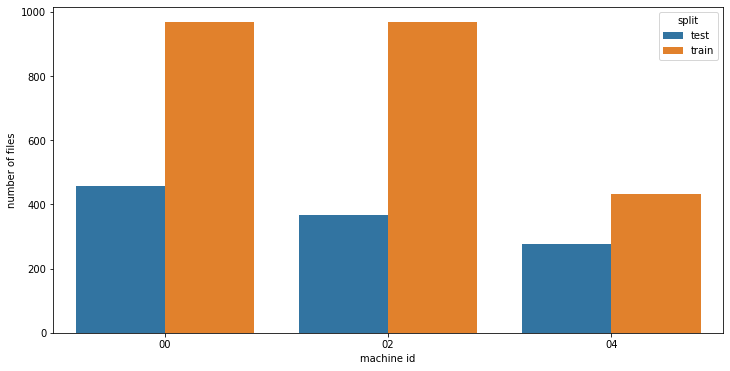

id      00         02         04      
split test train test train test train
file   456   968  367   968  278   434
type   456   968  367   968  278   434

In [ ]:
# development dataset
DATA_ROOT=Path("data/dev_data/dev_data")
types = [t.name for t in sorted(DATA_ROOT.glob('*')) if t.is_dir()]
print('Machine types:', types)

df = pd.DataFrame()
df['file'] = sorted(DATA_ROOT.glob('*/*/*.wav'))
df['type'] = df.file.map(lambda f: f.parent.parent.name)
df['split'] = df.file.map(lambda f: f.parent.name)
df['id'] = df.file.map(lambda s: str(s).split('/')[-1].split('_')[-2])
df_dev = df
df_dev['file'] = df_dev['file'].astype("string")

agg = df.groupby(['id', 'split']).agg('count')
fig = plt.figure(figsize=(12.0, 6.0))
g = sns.barplot(x="id", y="file", hue="split", data=agg.reset_index())
plt.xlabel("machine id")
plt.ylabel("number of files")
plt.show()
agg.transpose()

Machine types: ['slider']


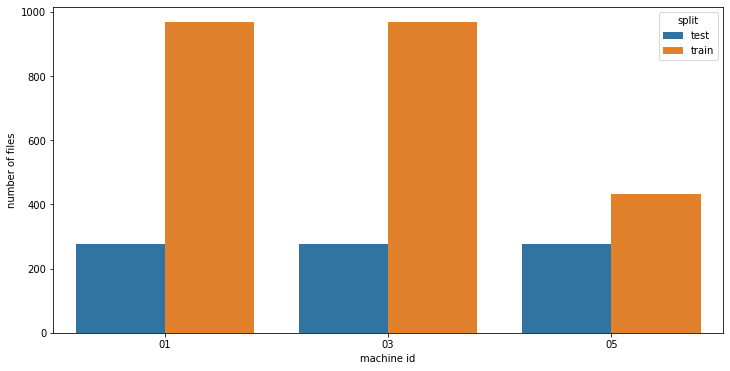

id      01         03         05      
split test train test train test train
file   278   968  278   968  278   434
type   278   968  278   968  278   434

In [ ]:
# evaluation dataset
EVAL_DATA_ROOT=Path("data/eval_data/eval_data")
types = [t.name for t in sorted(EVAL_DATA_ROOT.glob('*')) if t.is_dir()]
print('Machine types:', types)

df = pd.DataFrame()
df['file'] = sorted(EVAL_DATA_ROOT.glob('*/*/*.wav'))
df['type'] = df.file.map(lambda f: f.parent.parent.name)
df['split'] = df.file.map(lambda f: f.parent.name)
df['id'] = df.file.map(lambda s: str(s).split('/')[-1].split('_')[-2])
df_eval = df
df_eval['file'] = df_eval['file'].astype("string")

agg = df.groupby(['id', 'split']).agg('count')
fig = plt.figure(figsize=(12.0, 6.0))
g = sns.barplot(x="id", y="file", hue="split", data=agg.reset_index())
plt.xlabel("machine id")
plt.ylabel("number of files")
plt.show()
agg.transpose()

In [ ]:
def get_log_mel_spectrogram(filename, n_mels=64,
                        n_fft=1024,
                        hop_length=512,
                        power=2.0):
    wav, sampling_rate = com.file_load(filename)
    mel_spectrogram = librosa.feature.melspectrogram(y=wav,
                                                     sr=sampling_rate,
                                                     n_fft=n_fft,
                                                     hop_length=hop_length,
                                                     n_mels=n_mels,
                                                     power=power)
    log_mel_spectrogram = 20.0 / power * np.log10(mel_spectrogram + sys.float_info.epsilon)
    return log_mel_spectrogram, wav, sampling_rate


The raw audio file is time-seris data which indicates the amplitude of the sound over time (right figures). 

However, deep learning models rarely take this raw audio directly as input, the common practice is to convert the audio into a spectrogram (left figures). The spectrogram is a concise ‘snapshot’ of an audio wave and since it is an image, it is well suited to being input to CNN-based architectures developed for handling images. If you want to understand the audio spectrogram, this Audio Deep Learning [series](https://towardsdatascience.com/audio-deep-learning-made-simple-part-1-state-of-the-art-techniques-da1d3dff2504) is very useful. In this notebook, we use the spectrogram as input.

**Wawe Forms**

In [ ]:
import librosa
def load_sound_file(path, mono=False, channel=0):
    signal, sr = librosa.load(path, sr=None, mono=mono)
    if signal.ndim < 2:
        sound_file = signal, sr
    else:
        sound_file = signal[channel, :], sr

    return sound_file

In [ ]:
# Code used for styling of the plots
plt.style.use("Solarize_Light2")
prop_cycle = plt.rcParams["axes.prop_cycle"]
colors = prop_cycle.by_key()["color"]

In [ ]:
import IPython.display
import librosa.display

## Machine Sounds

In [ ]:
def get_sound_sample(id, ix, train_test="train", dev_eval="dev", nor_anom="normal"):
  if dev_eval == "dev":
    selected = df_dev.loc[(df_dev["id"]==id) & (df_dev["split"]==train_test) & (df_dev['file'].str.contains(nor_anom))].reset_index()
    return  Path(selected.file[ix])
  elif dev_eval == "eval":
    if nor_anom=="":
      selected = df_eval.loc[(df_eval["id"]==id) & (df_eval["split"]==train_test)].reset_index()
      return  Path(selected.file[ix])
    selected = df_eval.loc[(df_eval["id"]==id) & (df_eval["split"]==train_test) & (df_eval['file'].str.contains(nor_anom))].reset_index()
    return  Path(selected.file[ix])

### Machine 00 (01)

In [ ]:
file_path = get_sound_sample("00", 4)
print(file_path)
normal_signal, sr = load_sound_file(file_path)
IPython.display.Audio(normal_signal, rate=sr) #code to listen to sound of wav-file

data/dev_data/dev_data/slider/train/normal_id_00_00000004.wav


In [ ]:
file_path = get_sound_sample("00", 0, "test", "dev", "anomaly")
print(file_path)
normal_signal, sr = load_sound_file(file_path)
IPython.display.Audio(normal_signal, rate=sr) #code to listen to sound of wav-file

data/dev_data/dev_data/slider/test/anomaly_id_00_00000000.wav


In [ ]:
file_path = get_sound_sample("01", 7, "train", "eval", "normal")
print(file_path)
normal_signal, sr = load_sound_file(file_path)
IPython.display.Audio(normal_signal, rate=sr) #code to listen to sound of wav-file

data/eval_data/eval_data/slider/train/normal_id_01_00000007.wav


In [ ]:
file_path = get_sound_sample("01", 19, "test", "eval", "")
print(file_path)
normal_signal, sr = load_sound_file(file_path)
IPython.display.Audio(normal_signal, rate=sr) #code to listen to sound of wav-file

data/eval_data/eval_data/slider/test/id_01_00000019.wav


### Machine 02 (03)

In [ ]:
file_path = get_sound_sample("02", 2)
print(file_path)
normal_signal, sr = load_sound_file(file_path)
IPython.display.Audio(normal_signal, rate=sr) #code to listen to sound of wav-file

data/dev_data/dev_data/slider/train/normal_id_02_00000002.wav


In [ ]:
file_path = get_sound_sample("02", 5, "test", "dev", "anomaly")
print(file_path)
normal_signal, sr = load_sound_file(file_path)
IPython.display.Audio(normal_signal, rate=sr) #code to listen to sound of wav-file

data/dev_data/dev_data/slider/test/anomaly_id_02_00000000.wav


In [ ]:
file_path = get_sound_sample("03",11, "train", "eval", "normal")
print(file_path)
normal_signal, sr = load_sound_file(file_path)
IPython.display.Audio(normal_signal, rate=sr) #code to listen to sound of wav-file

data/eval_data/eval_data/slider/train/normal_id_03_00000011.wav


### Machine 04 (05)


In [ ]:
file_path = get_sound_sample("04", 2)
print(file_path)
normal_signal, sr = load_sound_file(file_path)
IPython.display.Audio(normal_signal, rate=sr) #code to listen to sound of wav-file

data/dev_data/dev_data/slider/train/normal_id_04_00000002.wav


In [ ]:
file_path = get_sound_sample("04", 6, "test", "dev", "anomaly")
print(file_path)
normal_signal, sr = load_sound_file(file_path)
IPython.display.Audio(normal_signal, rate=sr) #code to listen to sound of wav-file

data/dev_data/dev_data/slider/test/anomaly_id_04_00000006.wav


In [ ]:
file_path = get_sound_sample("05", 0, "train", "eval", "normal")
print(file_path)
normal_signal, sr = load_sound_file(file_path)
IPython.display.Audio(normal_signal, rate=sr) #code to listen to sound of wav-file

data/eval_data/eval_data/slider/train/normal_id_05_00000000.wav


## Plot Machine Sounds (Wave and Mel)


### Functions

In [ ]:
def plot_waves(normal, anomaly, sr, id):
  fig = plt.figure(figsize=(24, 6))

  plt.subplot(1, 3, 1)

  librosa.display.waveplot(
      normal,
      sr=sr,
      alpha=0.5,
      color=colors[1],
      linewidth=0.5,
      label=f"Machine #id_{id} - Normal Signal",
  )
  plt.title("Normal Signal")

  plt.subplot(1, 3, 2)
  librosa.display.waveplot(
      anomaly,
      sr=sr,
      alpha=0.6,
      color=colors[5],
      linewidth=0.5,
      label=f"Machine #id_{id} - Abnormal Signal",
  )
  plt.title("Abnormal Signal")

  plt.subplot(1, 3, 3)
  librosa.display.waveplot(
      anomaly,
      sr=sr,
      alpha=0.6,
      color=colors[5],
      linewidth=0.5,
      label="Abnormal Signal",
  )
  librosa.display.waveplot(
      normal,
      sr=sr,
      alpha=0.5,
      color=colors[1],
      linewidth=0.5,
      label="Normal Signal",
  )
  plt.title("Both Signals")

  fig.suptitle(f"Machine #id_{id} - 2D Representation of the Wave Forms", fontsize=16)
  plt.legend()
  plt.show()

In [ ]:
def plot_mels(normal, anomaly, sr, n_mels=64, hop_length=512, n_fft=2048, power=2.0):
  normal_mel_spectrogram = librosa.feature.melspectrogram(
      normal, sr=sr, n_fft=n_fft, hop_length=hop_length, n_mels=n_mels
  )
  normal_log_mel_spectrogram = 20.0 / power * np.log10(normal_mel_spectrogram + sys.float_info.epsilon)

  abnormal_mel_spectrogram = librosa.feature.melspectrogram(
      anomaly, sr=sr, n_fft=n_fft, hop_length=hop_length, n_mels=n_mels
  )
  abnormal_log_mel_spectrogram = 20.0 / power * np.log10(abnormal_mel_spectrogram + sys.float_info.epsilon)

  fig = plt.figure(figsize=(24, 6))

  plt.subplot(1, 2, 1)
  librosa.display.specshow(
      normal_log_mel_spectrogram,
      sr=sr,
      hop_length=hop_length,
      x_axis="time",
      y_axis="mel",
      cmap="viridis",
  )
  plt.title("Machine #id_02 - Normal Signal")
  plt.xlabel("Time (s)")
  plt.ylabel("Frequency (Hz)")
  plt.colorbar(format="%+2.0f dB")

  plt.subplot(1, 2, 2)
  librosa.display.specshow(
      abnormal_log_mel_spectrogram,
      sr=sr,
      hop_length=hop_length,
      x_axis="time",
      y_axis="mel",
      cmap="viridis",
  )
  plt.title("Machine #id_02 - Abnormal Signal")
  plt.xlabel("Time (s)")
  plt.ylabel("Frequency (Hz)")
  plt.colorbar(format="%+2.0f dB")

  plt.show()

  print(f"The mel-spectrograms have a {normal_mel_spectrogram.shape} shape.")

### Machine 00 (01)

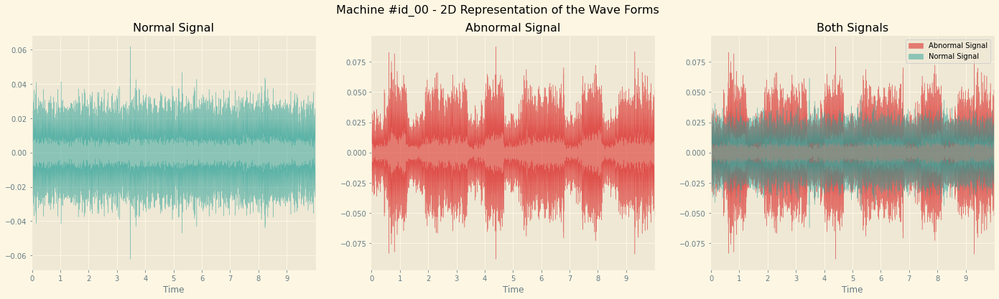

In [ ]:
normal, sr =load_sound_file(get_sound_sample("00", 0))
anomaly, _ = load_sound_file(get_sound_sample("00", 0, "test", "dev", "anomaly"))
plot_waves(normal, anomaly, sr, "00")

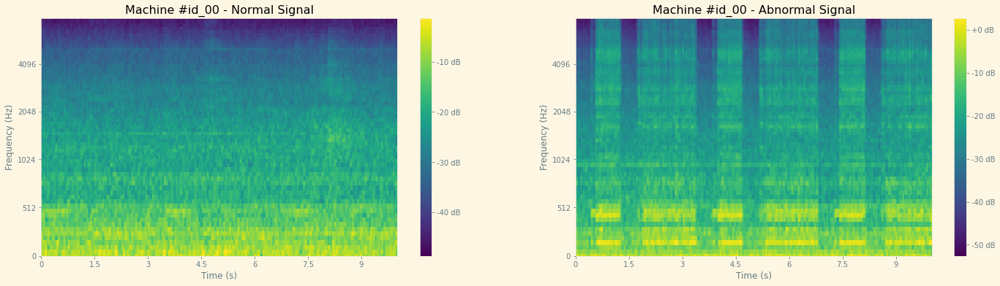

The mel-spectrograms have a (64, 313) shape.


In [ ]:
normal, sr = load_sound_file(get_sound_sample("00", 0))
anomaly, _ = load_sound_file(get_sound_sample("00", 0, "test", "dev", "anomaly"))
plot_mels(normal, anomaly, sr)

### Machine 02 (03)

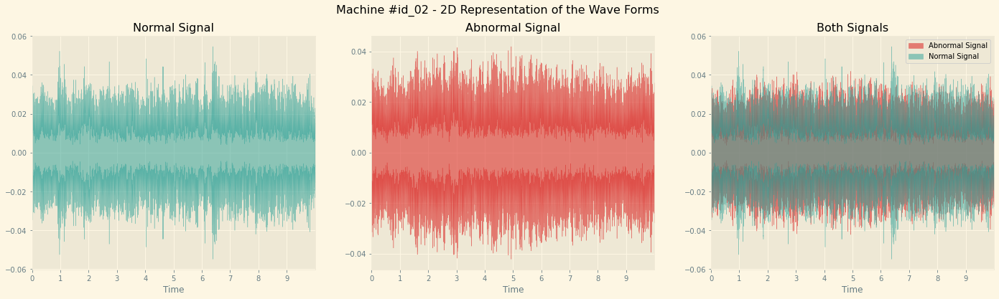

In [ ]:
normal, sr = load_sound_file(get_sound_sample("02", 0))
anomaly, _ = load_sound_file(get_sound_sample("02", 8, "test", "dev", "anomaly"))
plot_waves(normal, anomaly, sr, "02")

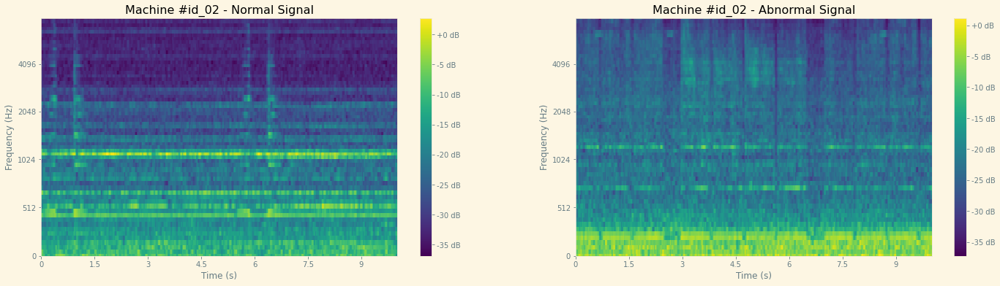

The mel-spectrograms have a (64, 313) shape.


In [ ]:
normal, sr = load_sound_file(get_sound_sample("02", 0))
anomaly, _ = load_sound_file(get_sound_sample("02", 0, "test", "dev", "anomaly"))
plot_mels(normal, anomaly, sr)

### Machine 04 (05)

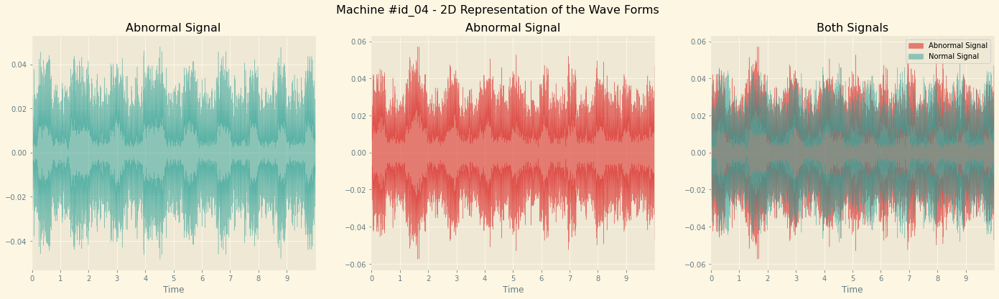

In [ ]:
normal, sr = load_sound_file(get_sound_sample("04", 0))
anomaly, _ = load_sound_file(get_sound_sample("04", 0, "test", "dev", "anomaly"))
plot_waves(normal, anomaly, sr, "04")

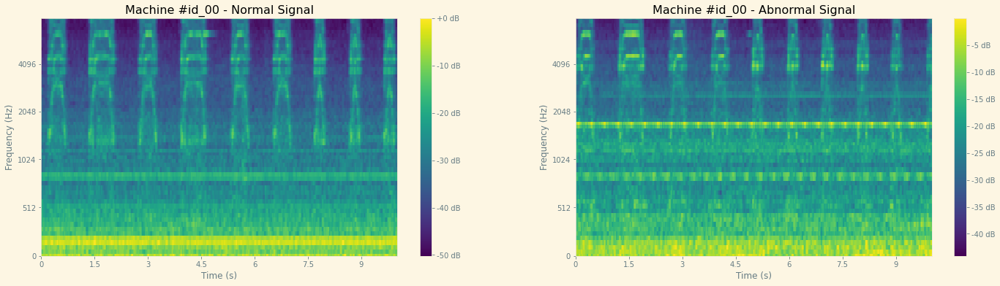

The mel-spectrograms have a (64, 313) shape.


In [ ]:
normal, sr = load_sound_file(get_sound_sample("04", 0))
anomaly, _ = load_sound_file(get_sound_sample("04", 0, "test", "dev", "anomaly"))
plot_mels(normal, anomaly)

## Feature Extraction

### RMS

In [ ]:
def RMS(y, sr, title):
  # Get RMS value from each frame's magnitude value
  S, phase = librosa.magphase(librosa.stft(y))
  rms = librosa.feature.rms(S=S)
  # Plot the RMS energy
  fig, ax = plt.subplots(figsize=(15, 6), nrows=2, sharex=True)
  times = librosa.times_like(rms)
  ax[0].semilogy(times, rms[0], label='RMS Energy')
  ax[0].set(xticks=[])
  ax[0].legend()
  ax[0].label_outer()
  librosa.display.specshow(librosa.amplitude_to_db(S, ref=np.max),
                          y_axis='log', x_axis='time', ax=ax[1])
  ax[1].set(title=title)

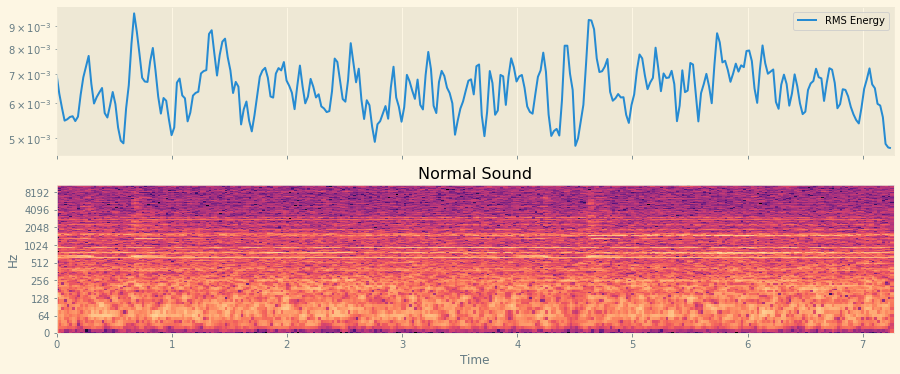

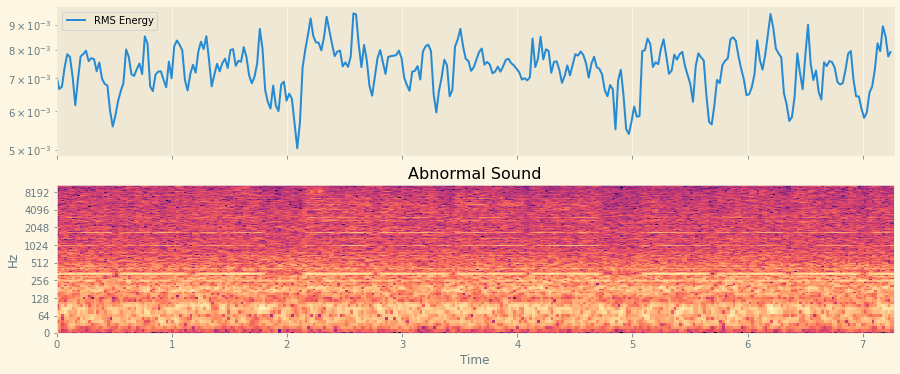

In [ ]:
# normal, sr = load_sound_file(get_sound_sample("00", 0))
# anomaly, _ = load_sound_file(get_sound_sample("00", 0, "test", "dev", "anomaly"))
normal, sr = load_sound_file(get_sound_sample("02", 0))
anomaly, _ = load_sound_file(get_sound_sample("02", 0, "test", "dev", "anomaly"))
RMS(normal, sr, "Normal Sound")
RMS(anomaly, sr, "Abnormal Sound")

### Zero Crossing Rate

In [ ]:
def zero_crossing_rate(y, sr, title="Plot"):
  zcrs = librosa.feature.zero_crossing_rate(y)
  print(f"Zero crossing rate: {sum(librosa.zero_crossings(y))}")
  return sum(librosa.zero_crossings(y))
  #plt.figure(figsize=(15, 3))
  #plt.plot(zcrs[0])
  #plt.title(title)

In [ ]:
# normal, sr = load_sound_file(get_sound_sample("00", 0))
# anomaly, _ = load_sound_file(get_sound_sample("00", 0, "test", "dev", "anomaly"))
normal, sr = load_sound_file(get_sound_sample("02", 0))
anomaly, _ = load_sound_file(get_sound_sample("02", 0, "test", "dev", "anomaly"))
zero_crossing_rate(normal, sr, "Normal")
zero_crossing_rate(anomaly, sr, "Abnormal")

Zero crossing rate: 24158
Zero crossing rate: 29126


29126

### Chroma

In [ ]:
def chroma(x, sr, title="Title"):
  hop_length = 512
  chromagram = librosa.feature.chroma_stft(x, sr=sr, hop_length=hop_length)
  fig, ax = plt.subplots(figsize=(15, 3))
  plt.title(title)
  img = librosa.display.specshow(chromagram, x_axis='time', y_axis='chroma', hop_length=hop_length, cmap='coolwarm')
  fig.colorbar(img, ax=ax)

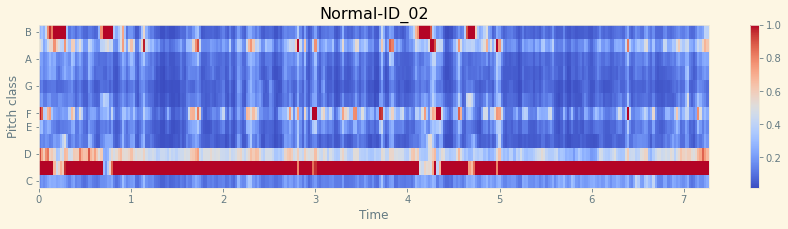

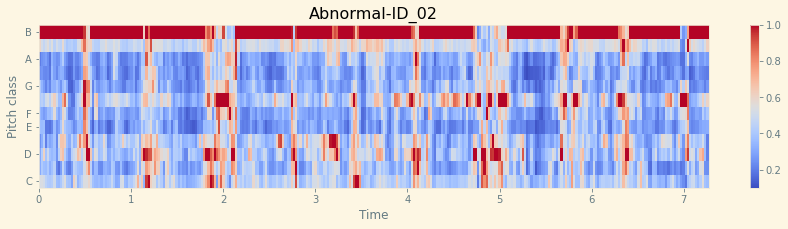

In [ ]:
# normal, sr = load_sound_file(get_sound_sample("00", 0))
# anomaly, _ = load_sound_file(get_sound_sample("00", 0, "test", "dev", "anomaly"))
normal, sr = load_sound_file(get_sound_sample("02", 0))
anomaly, _ = load_sound_file(get_sound_sample("02", 0, "test", "dev", "anomaly"))
chroma(normal, sr, "Normal-ID_02")
chroma(anomaly, sr, "Abnormal-ID_02")

### Tempogram

In [ ]:
def tempogram(y, sr, title="tempogram"):
  hop_length = 512
  # Compute local onset autocorrelation
  oenv = librosa.onset.onset_strength(y=y, sr=sr, hop_length=hop_length)
  times = librosa.times_like(oenv, sr=sr, hop_length=hop_length)
  tempogram = librosa.feature.tempogram(onset_envelope=oenv, sr=sr,
                                        hop_length=hop_length)
  # Estimate the global tempo for display purposes
  tempo = librosa.beat.tempo(onset_envelope=oenv, sr=sr,
                            hop_length=hop_length)[0]
  fig, ax = plt.subplots(figsize=(15, 3))
  img = librosa.display.specshow(tempogram, x_axis='time', y_axis='chroma', hop_length=hop_length, cmap='coolwarm')
  fig.colorbar(img, ax=ax)

/usr/local/lib/python3.7/dist-packages/librosa/filters.py:239: UserWarning: Empty filters detected in mel frequency basis. Some channels will produce empty responses. Try increasing your sampling rate (and fmax) or reducing n_mels.
  "Empty filters detected in mel frequency basis. "


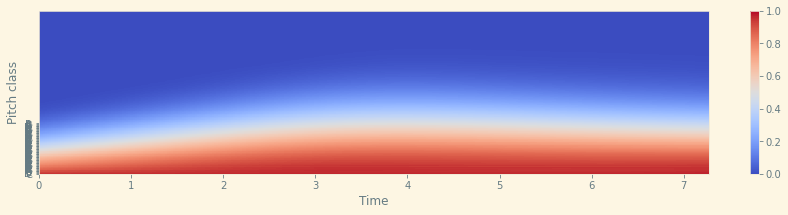

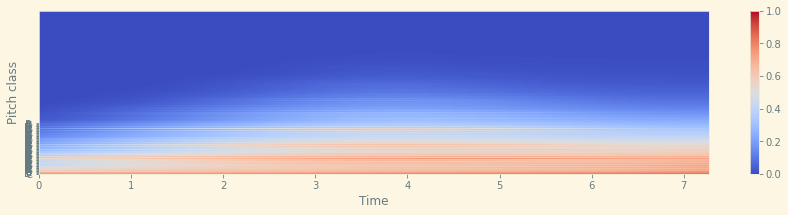

In [ ]:
normal, sr = load_sound_file(get_sound_sample("00", 0))
anomaly, _ = load_sound_file(get_sound_sample("00", 0, "test", "dev", "anomaly"))
tempogram(normal, sr, "Normal")
tempogram(anomaly, sr, "Abnormal")

### MFCCs

In [ ]:
def mfcc(y, sr, title="Title"):
  mfccs = librosa.feature.mfcc(y, sr=sr)
  # Displaying  the MFCCs:
  plt.figure(figsize=(15, 3))
  librosa.display.specshow(mfccs, sr=sr, x_axis='time')

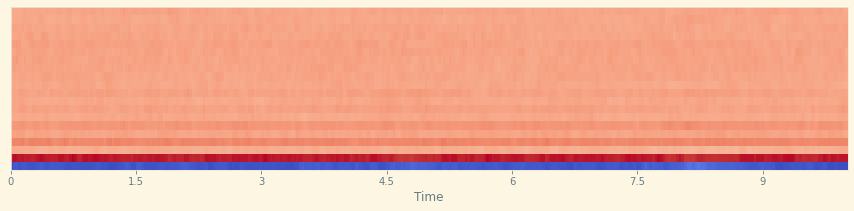

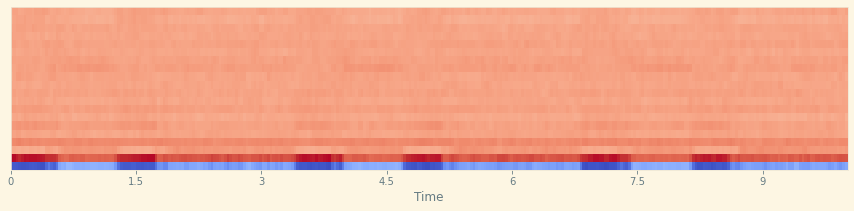

In [ ]:
normal, sr = load_sound_file(get_sound_sample("00", 0))
anomaly, _ = load_sound_file(get_sound_sample("00", 0, "test", "dev", "anomaly"))
mfcc(normal, sr, "Normal")
mfcc(anomaly, sr, "Abnormal")

# Network

The implementation of the Variational Auto-Encoder (VAE) model.

In [ ]:
class VAE(nn.Module):
    """Mostly borrowed from PyTorch example.
    Thanks to https://github.com/pytorch/examples/blob/master/vae/main.py
    """

    def __init__(self, device, x_dim=640, h_dim=400, z_dim=20):
        super().__init__()
        self.x_dim = x_dim

        self.fc11 = nn.Linear(x_dim, h_dim)
        self.fc12 = nn.Linear(h_dim, h_dim)
        self.fc21 = nn.Linear(h_dim, z_dim)
        self.fc22 = nn.Linear(h_dim, z_dim)
        self.fc31 = nn.Linear(z_dim, h_dim)
        self.fc32 = nn.Linear(h_dim, h_dim)
        self.fc4 = nn.Linear(h_dim, x_dim)

    def encode(self, x):
        x = F.relu(self.fc11(x))
        x = F.relu(self.fc12(x))
        return self.fc21(x), self.fc22(x)

    def reparameterize(self, mu, logvar):
        std = torch.exp(0.5*logvar)
        eps = torch.randn_like(std)
        return mu + eps*std

    def decode(self, z):
        h = F.relu(self.fc31(z))
        h = F.relu(self.fc32(h))
        return torch.sigmoid(self.fc4(h))

    def forward_all(self, x):
        mu, logvar = self.encode(x.view(-1, self.x_dim))
        z = self.reparameterize(mu, logvar)
        return self.decode(z), z, mu, logvar

    def forward(self, x):
        yhat, _, _, _ = self.forward_all(x)
        return yhat


def VAE_loss_function(recon_x, x, mu, logvar, reconst_loss='mse', a_RECONST=1., a_KLD=1., x_dim=640):
    """Loss function for VAE which consists of reconstruction and KL divergence losses.
    Thanks to https://github.com/pytorch/examples/blob/master/vae/main.py

    You can also balance weights for each loss, just to see what if KLD loss is stronger, etc.

    Args:
        reconst_loss: Reconstruction loss calculation: 'mse' or 'bce'
        a_RECONST: Weight for reconstruction loss.
        a_KLD: Weight for KLD loss.
    """

    func = (F.mse_loss if reconst_loss == 'mse'
            else F.binary_cross_entropy if reconst_loss == 'bce'
            else 'Unknown reconst_loss')
    RECONST = func(recon_x, x.view(-1, x_dim), reduction='sum')

    # see Appendix B from VAE paper:
    # Kingma and Welling. Auto-Encoding Variational Bayes. ICLR, 2014
    # https://arxiv.org/abs/1312.6114
    # 0.5 * sum(1 + log(sigma^2) - mu^2 - sigma^2)
    KLD = -0.5 * torch.sum(1 + logvar - mu.pow(2) - logvar.exp())

    return RECONST*a_RECONST + KLD*a_KLD


In [ ]:

"""
A Convolutional Variational Autoencoder
"""
class VAE(nn.Module):
    def __init__(self, imgChannels=1, featureDim=32*128*313, zDim=256):
        super(VAE, self).__init__()

        # Initializing the 2 convolutional layers and 2 full-connected layers for the encoder
        self.encConv1 = nn.Conv2d(imgChannels, 16, kernel_size=5, padding=2)
        self.encConv2 = nn.Conv2d(16, 32, kernel_size=5, padding=2)
        self.encFC1 = nn.Linear(featureDim, zDim)
        self.encFC2 = nn.Linear(featureDim, zDim)

        # Initializing the fully-connected layer and 2 convolutional layers for decoder
        self.decFC1 = nn.Linear(zDim, featureDim)
        self.decConv1 = nn.ConvTranspose2d(32, 16, kernel_size=5, padding=2)
        self.decConv2 = nn.ConvTranspose2d(16, imgChannels, kernel_size=5, padding=2)

    def encoder(self, x):

        # Input is fed into 2 convolutional layers sequentially
        # The output feature map are fed into 2 fully-connected layers to predict mean (mu) and variance (logVar)
        # Mu and logVar are used for generating middle representation z and KL divergence loss
        #print("first",x.shape)
        x = x.unsqueeze(1)
        #print("second",x.shape)
        x = F.relu(self.encConv1(x))
        #print("thirdq",x.shape)
        x = F.relu(self.encConv2(x))
        #print("third",x.shape)
        x = x.view(-1, 32*128*313)
        #print("fourth", x.shape)
        mu = self.encFC1(x)
        logVar = self.encFC2(x)
        return mu, logVar

    def reparameterize(self, mu, logVar):

        #Reparameterization takes in the input mu and logVar and sample the mu + std * eps
        std = torch.exp(logVar/2)
        eps = torch.randn_like(std)
        return mu + std * eps

    def decoder(self, z):

        # z is fed back into a fully-connected layers and then into two transpose convolutional layers
        # The generated output is the same size of the original input
        #print("dec0",z.shape)
        x = F.relu(self.decFC1(z))
        #print("dec1",x.shape)
        x = x.view(-1, 32, 128, 313)
        #print("dec2",x.shape)
        x = F.relu(self.decConv1(x))
        x = torch.sigmoid(self.decConv2(x))
        #print("out",x.shape)
        return x

    def forward_all(self, x):
        mu, logVar = self.encoder(x)
        z = self.reparameterize(mu, logVar)
        out = self.decoder(z)
        return out, z, mu, logVar

    def forward(self, x):
        yhat, _, _, _ = self.forward_all(x)
        return yhat
        # The entire pipeline of the VAE: encoder -> reparameterization -> decoder
        # output, mu, and logVar are returned for loss computation
        
    
    
def VAE_loss_function(recon_x, x, mu, logvar, reconst_loss='mse', a_RECONST=1., a_KLD=1., x_dim=640):
    """Loss function for VAE which consists of reconstruction and KL divergence losses.
    Thanks to https://github.com/pytorch/examples/blob/master/vae/main.py

    You can also balance weights for each loss, just to see what if KLD loss is stronger, etc.

    Args:
        reconst_loss: Reconstruction loss calculation: 'mse' or 'bce'
        a_RECONST: Weight for reconstruction loss.
        a_KLD: Weight for KLD loss.
    """

    func = (F.mse_loss if reconst_loss == 'mse'
            else F.binary_cross_entropy if reconst_loss == 'bce'
            else 'Unknown reconst_loss')
    #print("recon:",recon_x.shape,"x",x.shape )
    recon_x = torch.squeeze(recon_x,1)
    #print("recon:",recon_x.shape,"x",x.shape )
    RECONST = func(recon_x, x, reduction='sum')

    # see Appendix B from VAE paper:
    # Kingma and Welling. Auto-Encoding Variational Bayes. ICLR, 2014
    # https://arxiv.org/abs/1312.6114
    # 0.5 * sum(1 + log(sigma^2) - mu^2 - sigma^2)
    KLD = -0.5 * torch.sum(1 + logvar - mu.pow(2) - logvar.exp())

    return RECONST*a_RECONST + KLD*a_KLD

# Parameters

In [ ]:
params = {
# inout directory
"dev_directory" : "data/dev_data/dev_data",
"eval_directory" : "data/eval_data/eval_data",
"model_directory": "./model",
"result_directory": "./result",
"result_file": "result.csv",
"max_fpr" : 0.1,
"mode" : True, # mode=True for development dataset, mode=False for evaluation dataset

# preprocessing for mel-spectrogram
"feature": {
"n_mels": 128,
"frames" : 5,
"n_fft": 1024,
"hop_length": 512,
"power": 2.0},

# training
"fit":{
"lr": 0.01,
"b1": 0.9,
"b2": 0.999,
"weight_decay": 0.0,
"epochs" : 50,
"batch_size" : 32,
"shuffle" : True,
"validation_split" : 0.1,
"verbose" : 1},
    
# model architecture
"VAE":{
"x_dim": 640,
"h_dim": 400,
"z_dim": 20}
    
}
params = EasyDict(params)

# create working directory
ensure_folder(params.model_directory)

# test directories
dirs = com.select_dirs(param=params, mode=params.mode)
print(dirs)
# fix random seeds
deterministic_everything(2020, pytorch=True)

# PyTorch device
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

2022-05-19 13:44:59,190 - INFO - load_directory <- development


['/content/data/dev_data/dev_data/slider']


# Training

In [ ]:
class Task2Dataset(torch.utils.data.Dataset):
    """PyTorch dataset class for task2. Caching to a file supported.

    Args:
        n_mels, frames, n_fft, hop_length, power, transform: Audio conversion settings.
        normalize: Normalize data value range from [-90, 24] to [0, 1] for VAE, False by default.
        cache_to: Cache filename or None by default, use this for your iterative development.
    """

    def __init__(self, files, n_mels, frames, n_fft, hop_length, power, transform,
                 normalize=False, cache_to=None):
        self.transform = transform
        self.files = files
        self.n_mels, self.frames, self.n_fft = n_mels, frames, n_fft
        self.hop_length, self.power = hop_length, power
        self.normalize = normalize

    def __len__(self):
        return len(self.files)

    def __getitem__(self, index):
        x, _ = get_log_mel_spectrogram(self.files[index],
                                 n_mels=self.n_mels,
                                 n_fft=self.n_fft,
                                 hop_length=self.hop_length,
                                 power=self.power)
        if self.normalize:
            x = pytorch_common.normalize_0to1(x)
        x = self.transform(x)
        return x.permute(1, 0, 2)

    # def __init__(self, files, n_mels, frames, n_fft, hop_length, power, transform,
    #              normalize=False, cache_to=None):
    #     self.transform = transform
    #     self.files = files
    #     self.n_mels, self.frames, self.n_fft = n_mels, frames, n_fft
    #     self.hop_length, self.power = hop_length, power
    #     # load cache or convert all the data for the first time
    #     if cache_to is not None and Path(cache_to).exists():
    #         com.logger.info(f'Loading cached {Path(cache_to).name}')
    #         self.X = np.load(cache_to)
    #     else:
    #         self.X = []
    #         for filename in files:
    #             img, _ = get_log_mel_spectrogram(filename,
    #                              n_mels=self.n_mels,
    #                              n_fft=self.n_fft,
    #                              hop_length=self.hop_length,
    #                              power=self.power)
    #             self.X.append(img)
    #         self.X = np.array(self.X)
    #         if cache_to is not None:
    #             np.save(cache_to, self.X)
    #         # self.X = com.list_to_vector_array(self.files,
    #         #                  n_mels=self.n_mels,
    #         #                  frames=self.frames,
    #         #                  n_fft=self.n_fft,
    #         #                  hop_length=self.hop_length,
    #         #                  power=self.power)
    #         # if cache_to is not None:
    #         #     np.save(cache_to, self.X)

    #     if normalize:
    #         self.X = pytorch_common.normalize_0to1(self.X)

    # def __len__(self):
    #     return len(self.X)

    # def __getitem__(self, index):
    #     x = self.X[index]
    #     x = self.transform(x)
    #     return x.permute(1, 0, 2) #x, x


# VAE Training class
class Task2VAELightning(pl.LightningModule):
    """Task2 PyTorch Lightning class, for training only."""

    def __init__(self, device, model, params, files, normalize=False):
        super().__init__()
        self.params = params
        self.normalize = normalize
        self.model = model
        self.mseloss = torch.nn.MSELoss()
        # split data files
        if files is not None:
            n_val = int(params.fit.validation_split * len(files))
            self.val_files = random.sample(files, n_val)
            self.train_files = [f for f in files if f not in self.val_files]

    def forward(self, x):
        return self.model(x)
    
    def training_step(self, batch, batch_nb):
        x, y = batch[0], batch[1]
        y_hat, z, mu, logvar = self.model.forward_all(x)
        loss = VAE_loss_function(recon_x=y_hat, x=x, mu=mu, logvar=logvar,
                                 reconst_loss='mse',
                                 a_RECONST=1.,
                                 a_KLD=.01)
        tensorboard_logs = {'train_loss': loss}
        return {'loss': loss, 'log': tensorboard_logs}

    def validation_step(self, batch, batch_nb):
        x, y = batch[0], batch[1]
        y_hat = self.forward(x)[0]
        #print(y_hat)
        return {'val_loss': self.mseloss(y_hat, y)}

    def validation_epoch_end(self, outputs):
        avg_loss = torch.stack([x['val_loss'] for x in outputs]).mean()
        tensorboard_logs = {'val_loss': avg_loss}
        return {'avg_val_loss': avg_loss, 'log': tensorboard_logs}

    def configure_optimizers(self):
        return torch.optim.Adam(self.parameters(), lr=self.params.fit.lr,
                                betas=(self.params.fit.b1, self.params.fit.b2),
                                weight_decay=self.params.fit.weight_decay)

    def _get_dl(self, for_what):
        files = self.train_files if for_what == 'train' else self.val_files
        cache_file = f'{self.params.model_directory}/__cache_{str(files[0]).split("/")[-3]}_{for_what}.npy'
        ds = Task2Dataset(files,
                          n_mels=self.params.feature.n_mels,
                          frames=self.params.feature.frames,
                          n_fft=self.params.feature.n_fft,
                          hop_length=self.params.feature.hop_length,
                          power=self.params.feature.power,
                          transform=ToTensor1ch(device=device),
                          normalize=self.normalize,
                          cache_to=cache_file)
        print("BATCH_SIXE",self.params.fit.batch_size)
        return torch.utils.data.DataLoader(ds, batch_size=self.params.fit.batch_size,
                          shuffle=(self.params.fit.shuffle if for_what == 'train' else False))

    def train_dataloader(self):
        return self._get_dl('train')

    def val_dataloader(self):
        return self._get_dl('val')

In [ ]:
#!pip install wandb
#import wandb
#wandb.init()

In [ ]:
import gc
del variables
gc.collect()

NameError: ignored

In [ ]:
import torch
torch.cuda.empty_cache()

In [ ]:
torch.cuda.memory_summary(device=None, abbreviated=False)

'|===========================================================================|\n|                  PyTorch CUDA memory summary, device ID 0                 |\n|---------------------------------------------------------------------------|\n|            CUDA OOMs: 2            |        cudaMalloc retries: 3         |\n|===========================================================================|\n|        Metric         | Cur Usage  | Peak Usage | Tot Alloc  | Tot Freed  |\n|---------------------------------------------------------------------------|\n| Allocated memory      |    6269 MB |   13791 MB |   22709 MB |   16439 MB |\n|       from large pool |    6269 MB |   13791 MB |   22673 MB |   16403 MB |\n|       from small pool |       0 MB |       5 MB |      35 MB |      35 MB |\n|---------------------------------------------------------------------------|\n| Active memory         |    6269 MB |   13791 MB |   22709 MB |   16439 MB |\n|       from large pool |    6269 MB |   13791 MB |

In [ ]:
# train models

def train():
    for target_dir in dirs:
        target = str(target_dir).split('/')[-1]
        print(f'==== Start training [{target}] with {torch.cuda.device_count()} GPU(s). ====')

        files = com.file_list_generator(target_dir)

        model = VAE().to(device)
        #summary(device, model)
        task2 = Task2VAELightning(device, model, params, files, normalize=True)
        trainer = pl.Trainer(max_epochs=params.fit.epochs,
                             gpus=torch.cuda.device_count())
        trainer.fit(task2)

        model_file = f'{params.model_directory}/model_{target}.pth'
        torch.save(task2.model.state_dict(), model_file)
        print(f'saved {model_file}.\n')
        
train()

2022-05-19 13:50:53,250 - INFO - target_dir : dev_data/slider
2022-05-19 13:50:53,260 - INFO - # of training samples : 2370


==== Start training [slider] with 1 GPU(s). ====


Sanity Checking: 0it [00:00, ?it/s]

BATCH_SIXE 32


/usr/local/lib/python3.7/dist-packages/pytorch_lightning/trainer/connectors/data_connector.py:245: PossibleUserWarning: The dataloader, val_dataloader 0, does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` (try 4 which is the number of cpus on this machine) in the `DataLoader` init to improve performance.
  category=PossibleUserWarning,


BATCH_SIXE 32


/usr/local/lib/python3.7/dist-packages/pytorch_lightning/trainer/connectors/data_connector.py:245: PossibleUserWarning: The dataloader, train_dataloader, does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` (try 4 which is the number of cpus on this machine) in the `DataLoader` init to improve performance.
  category=PossibleUserWarning,


Training: 0it [00:00, ?it/s]

RuntimeError: ignored

# Optuna Tuning

In [ ]:
!pip install optuna

In [ ]:
from sklearn.model_selection import train_test_split
import optuna

def objective(trial):

    # objective_params = {
    #           'learning_rate': trial.suggest_loguniform('learning_rate', 1e-5, 1e-1),
    #           #'optimizer': trial.suggest_categorical("optimizer", ["Adam", "RMSprop", "SGD"]),
    #           'z_unit': trial.suggest_int("n_unit", 4, 40),
    #           'h_unit': trial.suggest_int("h_unit", 200, 500)
    #           }
    params = {
      # inout directory
      "dev_directory" : "data/dev_data/dev_data",
      "eval_directory" : "data/eval_data/eval_data",
      "model_directory": "./model",
      "result_directory": "./result",
      "result_file": "result.csv",
      "max_fpr" : 0.1,
      "mode" : True, # mode=True for development dataset, mode=False for evaluation dataset

      # preprocessing for mel-spectrogram
      "feature": {
      "n_mels": 128,
      "frames" : 5,
      "n_fft": 1024,
      "hop_length": 512,
      "power": 2.0},

      # training
      "fit":{
      "lr": trial.suggest_loguniform('learning_rate', 1e-5, 1e-1),
      "b1": 0.9,
      "b2": 0.999,
      "weight_decay": 0.0,
      "epochs" : 3,
      "batch_size" : trial.suggest_int("h_unit", 200, 1000),
      "shuffle" : True,
      "validation_split" : 0.1,
      "verbose" : 1},
          
      # model architecture
      "VAE":{
      "x_dim": 640,
      "h_dim": trial.suggest_int("h_unit", 200, 500), #400
      "z_dim": trial.suggest_int("n_unit", 4, 40) #20
      }
          
    }
    to_tensor = pytorch_common.ToTensor1ch()
    device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
    print("DEVICE", device)
    params = EasyDict(params)



    # dir_eval = '/content/data/eval_data/eval_data/slider'
    # files = com.file_list_generator(dir_eval)
    # print("FILES", len(files), files)
    # dir_eval = '/content/data/eval_data/eval_data/slider'
    # test_files, y_true = test_file_list_generator(dir_eval, "", dir_name="train", mode=True)
    # test_files = sorted(test_files)
    # print("OTHER", test_files)
    dir_dev = '/content/data/dev_data/dev_data/slider'
    anomaly_files , anomaly_y = test_file_list_generator(dir_dev, "", dir_name="test", prefix_normal="anomaly", mode=True)
    d = {"filename": anomaly_files, "y": anomaly_y}
    anomaly_df = pd.DataFrame(data=d)
    anomaly_df = anomaly_df.sample(frac=0.2)
    dir_eval = '/content/data/eval_data/eval_data/slider'
    test_files, test_y = test_file_list_generator(dir_eval, "", dir_name="train", mode=True)
    d = {"filename": test_files, "y": test_y}
    normal_df = pd.DataFrame(data=d)
    normal_df = normal_df.sample(frac=0.5)
    concat = pd.concat([normal_df, anomaly_df])
    concat = concat.sample(frac=1)
    files = list(np.array(concat.filename))
    y = list(np.array(concat.y))


    X_train, X_test, y_train, y_test = train_test_split(files, y, test_size=0.33, random_state=42)

    model = VAE(device, x_dim=params.VAE.x_dim, h_dim=params.VAE.h_dim, z_dim=params.VAE.z_dim).to(device)
    summary(device, model)
    task2 = Task2VAELightning(device, model, params, X_train, normalize=True)
    trainer = pl.Trainer(max_epochs=params.fit.epochs,
                          gpus=torch.cuda.device_count())
    trainer.fit(task2)


    performance = []
    y_pred = [0. for k in X_test]
    for file_idx, file_path in tqdm(enumerate(X_test), total=len(X_test)):
        try:
            data = com.file_to_vector_array(file_path,
                                            n_mels=params.feature.n_mels,
                                            frames=params.feature.frames,
                                            n_fft=params.feature.n_fft,
                                            hop_length=params.feature.hop_length,
                                            power=params.feature.power)
            data = pytorch_common.normalize_0to1(data)
            with torch.no_grad():
                print("TO TENSOR:", to_tensor(data))
                yhat = model(to_tensor(data)).cpu().detach().numpy().reshape(data.shape)
                errors = numpy.mean(numpy.square(data - yhat), axis=1)
            y_pred[file_idx] = numpy.mean(errors)
            #anomaly_score_list.append([os.path.basename(file_path), y_pred[file_idx]])
        except:
            com.logger.error("file broken!!: {}".format(file_path))
            sys.exit(-1)
            
        auc = metrics.roc_auc_score(y_true, y_pred)
        #p_auc = metrics.roc_auc_score(y_true, y_pred, max_fpr=params.max_fpr)
        performance.append(auc)

    # calculate averages for AUCs and pAUCs
    averaged_performance = numpy.mean(numpy.array(performance, dtype=float), axis=0)
    return averaged_performance

study = optuna.create_study(direction="maximize", sampler=optuna.samplers.TPESampler())
study.optimize(objective, n_trials=30)

# Testing on Development dataset

In [ ]:
def test():
    # make output result directory
    os.makedirs(params.result_directory, exist_ok=True)

    # load base directory
    dirs = com.select_dirs(param=params, mode=params.mode)

    # initialize lines in csv for AUC and pAUC
    csv_lines = []

    # PyTorch version specific...
    to_tensor = pytorch_common.ToTensor1ch()
    device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

    # loop of the base directory
    for idx, target_dir in enumerate(dirs):
        print("\n===========================")
        print("[{idx}/{total}] {dirname}".format(dirname=target_dir, idx=idx+1, total=len(dirs)))
        machine_type = os.path.split(target_dir)[1]

        print("============== MODEL LOAD ==============")
        # set model path
        model_file = "{model}/model_{machine_type}.pth".format(model=params.model_directory,
                                                               machine_type=machine_type)

        # load model file
        if not os.path.exists(model_file):
            com.logger.error("{} model not found ".format(machine_type))
            sys.exit(-1)
        com.logger.info("loading model: {}".format(model_file))
        model = VAE(device, x_dim=params.VAE.x_dim, h_dim=params.VAE.h_dim, z_dim=params.VAE.z_dim).to(device)
        pytorch_common.load_weights(model, model_file)
        pytorch_common.summary(device, model)
        model.eval()

        if params.mode:
            # results by type
            csv_lines.append([machine_type])
            csv_lines.append(["id", "AUC", "pAUC"])
            performance = []

        machine_id_list = get_machine_id_list_for_test(target_dir)

        for id_str in machine_id_list:
            # load test file
            test_files, y_true = test_file_list_generator(target_dir, id_str, mode=params.mode)

            # setup anomaly score file path
            anomaly_score_csv = "{result}/anomaly_score_{machine_type}_{id_str}.csv".format(
                                                                                     result=params.result_directory,
                                                                                     machine_type=machine_type,
                                                                                     id_str=id_str)
            anomaly_score_list = []

            print("\n============== BEGIN TEST FOR A MACHINE ID ==============")
            y_pred = [0. for k in test_files]
            for file_idx, file_path in tqdm(enumerate(test_files), total=len(test_files)):
                try:
                    data = com.file_to_vector_array(file_path,
                                                    n_mels=params.feature.n_mels,
                                                    frames=params.feature.frames,
                                                    n_fft=params.feature.n_fft,
                                                    hop_length=params.feature.hop_length,
                                                    power=params.feature.power)
                    data = pytorch_common.normalize_0to1(data)
                    with torch.no_grad():
                        yhat = model(to_tensor(data)).cpu().detach().numpy().reshape(data.shape)
                        errors = numpy.mean(numpy.square(data - yhat), axis=1)
                    y_pred[file_idx] = numpy.mean(errors)
                    anomaly_score_list.append([os.path.basename(file_path), y_pred[file_idx]])
                except:
                    com.logger.error("file broken!!: {}".format(file_path))
                    sys.exit(-1)

            # save anomaly score
            save_csv(save_file_path=anomaly_score_csv, save_data=anomaly_score_list)
            com.logger.info("anomaly score result ->  {}".format(anomaly_score_csv))

            if params.mode:
                # append AUC and pAUC to lists
                auc = metrics.roc_auc_score(y_true, y_pred)
                p_auc = metrics.roc_auc_score(y_true, y_pred, max_fpr=params.max_fpr)
                csv_lines.append([id_str.split("_", 1)[1], auc, p_auc])
                performance.append([auc, p_auc])
                com.logger.info("AUC : {}".format(auc))
                com.logger.info("pAUC : {}".format(p_auc))

            print("\n============ END OF TEST FOR A MACHINE ID ============")

        if params.mode:
            # calculate averages for AUCs and pAUCs
            averaged_performance = numpy.mean(numpy.array(performance, dtype=float), axis=0)
            csv_lines.append(["Average"] + list(averaged_performance))
            csv_lines.append([])

    if params.mode:
        # output results
        result_path = "{result}/{file_name}".format(result=params.result_directory, file_name=params.result_file)
        com.logger.info("AUC and pAUC results -> {}".format(result_path))
        save_csv(save_file_path=result_path, save_data=csv_lines)

test()

In [ ]:
def upto_6digits(cell):
    if not cell[0].isdigit(): return cell
    return f'{float(cell):.6f}'

if params.mode:
    with open('./result/result.csv') as f:
        for l in f.readlines():
            l = l.strip() #replace('\n', '')
            if ',' not in l:
                print(l)
                continue
            ls = l.split(',')
            print(f'{ls[0]}\t\t{upto_6digits(ls[1])}\t\t{upto_6digits(ls[2])}')

# Testing on the Evaluation dataset and generating submission file

In [ ]:
# re-training on evaluation dataset
params.mode = False
# train() # due to the memory restriction, restart the kernel and train on only evaluation dataset

In [ ]:
test()

In [ ]:
import numpy as np
import pandas as pd

df1 = pd.read_csv('./result/anomaly_score_slider_id_01.csv', delimiter=',', header=None)
df3 = pd.read_csv('./result/anomaly_score_slider_id_03.csv', delimiter=',', header=None)
df5 = pd.read_csv('./result/anomaly_score_slider_id_05.csv', delimiter=',', header=None)

dfs = [df1, df3, df5]
eval_df = pd.concat(dfs)
eval_df = eval_df.rename(columns={0: "file_name", 1: "anomaly_score"})

eval_df.to_csv('./result/baseline_submission.csv',index = False)


In [ ]:
eval_df.head()

# **FOLLOWING IS THE CODE FOR THE SELF SUPERVISED LEARNING ARCHITECTURE**

**Since most of the code is rewritten we figured out it was best to just joine the whole thing in the same notebook.**

# Self Supervised Learning Architecture


In [ ]:
resnet50 = torchvision.models.resnet50()
mobnetv2 = torchvision.models.mobilenet_v2()

In [ ]:
resnet50.conv1 = torch.nn.Conv2d(1, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
resnet50.fc = torch.nn.Linear(in_features=2048, out_features=3, bias=True)
torchsummary.summary(resnet50.to("cuda"), (1, 128, 128))

RuntimeError: ignored

In [ ]:
mobnetv2.features[0][0] = torch.nn.Conv2d(1, 32, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
mobnetv2.classifier[1] = torch.nn.Linear(in_features=1280, out_features=3, bias=True)
torchsummary.summary(mobnetv2.to("cuda"), (1, 128, 128))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1           [-1, 32, 64, 64]             288
       BatchNorm2d-2           [-1, 32, 64, 64]              64
             ReLU6-3           [-1, 32, 64, 64]               0
            Conv2d-4           [-1, 32, 64, 64]             288
       BatchNorm2d-5           [-1, 32, 64, 64]              64
             ReLU6-6           [-1, 32, 64, 64]               0
            Conv2d-7           [-1, 16, 64, 64]             512
       BatchNorm2d-8           [-1, 16, 64, 64]              32
  InvertedResidual-9           [-1, 16, 64, 64]               0
           Conv2d-10           [-1, 96, 64, 64]           1,536
      BatchNorm2d-11           [-1, 96, 64, 64]             192
            ReLU6-12           [-1, 96, 64, 64]               0
           Conv2d-13           [-1, 96, 32, 32]             864
      BatchNorm2d-14           [-1, 96,

# Training

2022-05-22 15:14:39,722 - INFO - target_dir : eval_data/slider
2022-05-22 15:14:39,733 - INFO - # of training samples : 2370


==== Start training [slider] with 1 GPU(s). ====
['/content/data/eval_data/eval_data/slider/train/normal_id_01_00000000.wav', '/content/data/eval_data/eval_data/slider/train/normal_id_01_00000001.wav', '/content/data/eval_data/eval_data/slider/train/normal_id_01_00000002.wav', '/content/data/eval_data/eval_data/slider/train/normal_id_01_00000003.wav', '/content/data/eval_data/eval_data/slider/train/normal_id_01_00000004.wav', '/content/data/eval_data/eval_data/slider/train/normal_id_01_00000005.wav', '/content/data/eval_data/eval_data/slider/train/normal_id_01_00000006.wav', '/content/data/eval_data/eval_data/slider/train/normal_id_01_00000007.wav', '/content/data/eval_data/eval_data/slider/train/normal_id_01_00000008.wav', '/content/data/eval_data/eval_data/slider/train/normal_id_01_00000009.wav', '/content/data/eval_data/eval_data/slider/train/normal_id_01_00000010.wav', '/content/data/eval_data/eval_data/slider/train/normal_id_01_00000011.wav', '/content/data/eval_data/eval_data/sli

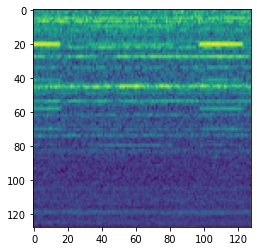

In [ ]:
class Task2Dataset(torch.utils.data.Dataset):
    """PyTorch dataset class for task2. Caching to a file supported.

    Args:
        n_mels, frames, n_fft, hop_length, power, transform: Audio conversion settings.
        normalize: Normalize data value range from [-90, 24] to [0, 1] for VAE, False by default.
        cache_to: Cache filename or None by default, use this for your iterative development.
    """

    def __init__(self, files, n_mels, frames, n_fft, hop_length, power, transform,
                 normalize=False, cache_to=None):
        self.transform = transform
        self.files = files
        self.n_mels, self.frames, self.n_fft = n_mels, frames, n_fft
        self.hop_length, self.power = hop_length, power
        self.normalize = normalize
        self.mapping = {1: 0, 3: 1, 5: 2}

    def __len__(self):
        return len(self.files)

    def __getitem__(self, index):
        x, _ = get_log_mel_spectrogram(self.files[index],
                                 n_mels=self.n_mels,
                                 n_fft=self.n_fft,
                                 hop_length=self.hop_length,
                                 power=self.power)
        if self.normalize:
            x = pytorch_common.normalize_0to1(x)
        if self.transform:
          x = self.transform(x)
          trs = torchvision.transforms.RandomCrop((128, 128))
          x = trs(x)

        label = self.mapping[int(self.files[index].split("_")[4][1])]
        
          
        return x, label


# VAE Training class
class Task2VAELightning(pl.LightningModule):
    """Task2 PyTorch Lightning class, for training only."""

    def __init__(self, device, model, params, files, normalize=False):
        super().__init__()
        self.params = params
        self.normalize = normalize
        self.model = model
        self.cel = torch.nn.CrossEntropyLoss()
        # split data files
        if files is not None:
            n_val = int(params.fit.validation_split * len(files))
            self.val_files = random.sample(files, n_val)
            self.train_files = [f for f in files if f not in self.val_files]

    def forward(self, x):
        return self.model.forward(x)
    
    def training_step(self, batch, batch_nb):
        x, y = batch
        x = x.to(device=device)
        y = y.to(device=device)
        y_hat= self.model.forward(x)
        loss = self.cel(y_hat, y)
        tensorboard_logs = {'train_loss': loss}
        return {'loss': loss, 'log': tensorboard_logs}

    def validation_step(self, batch, batch_nb):
        x, y = batch
        x = x.to(device=device)
        y = y.to(device=device)
        y_hat = self.forward(x)
        return {'val_loss': self.cel(y_hat, y)}

    def validation_epoch_end(self, outputs):
        avg_loss = torch.stack([x['val_loss'] for x in outputs]).mean()
        tensorboard_logs = {'val_loss': avg_loss}
        return {'avg_val_loss': avg_loss, 'log': tensorboard_logs}

    def configure_optimizers(self):
        optim = torch.optim.Adam(self.parameters(), lr=self.params.fit.lr,
                                betas=(self.params.fit.b1, self.params.fit.b2),
                                weight_decay=self.params.fit.weight_decay)
        return optim

    def _get_dl(self, for_what):
        files = self.train_files if for_what == 'train' else self.val_files
        cache_file = f'{self.params.model_directory}/__cache_{str(files[0]).split("/")[-3]}_{for_what}.npy'
        ds = Task2Dataset(files,
                          n_mels=self.params.feature.n_mels,
                          frames=self.params.feature.frames,
                          n_fft=self.params.feature.n_fft,
                          hop_length=self.params.feature.hop_length,
                          power=self.params.feature.power,
                          transform=pytorch_common.ToTensor1ch(device=self.device, image=True),
                          normalize=self.normalize,
                          cache_to=cache_file)
        return torch.utils.data.DataLoader(ds, batch_size=self.params.fit.batch_size,
                          shuffle=(self.params.fit.shuffle if for_what == 'train' else False))

    def train_dataloader(self):
        return self._get_dl('train')

    def val_dataloader(self):
        return self._get_dl('val')
    
    def get_ds(self, for_what):
        files = self.train_files if for_what == 'train' else self.val_files
        ds = Task2Dataset(files,
                          n_mels=self.params.feature.n_mels,
                          frames=self.params.feature.frames,
                          n_fft=self.params.feature.n_fft,
                          hop_length=self.params.feature.hop_length,
                          power=self.params.feature.power,
                          transform=pytorch_common.ToTensor1ch(device=self.device, image=True),
                          normalize=self.normalize,
                          cache_to=None)
        return ds


  
target = str(dir_eval).split('/')[-1]
print(f'==== Start training [{target}] with {torch.cuda.device_count()} GPU(s). ====')

files = com.file_list_generator(dir_eval)
#add_files = com.file_list_generator(dir_eval)
#files.extend(add_files)
print(files)

model = resnet50.to(device)
torchsummary.summary(model, (1, 128, 128))
task2 = Task2VAELightning(device, model, params, files, normalize=True)
ds = task2.get_ds("train")
x, label = ds[0]
print(x.shape)
print(label)
plt.imshow(x.squeeze().cpu())

In [ ]:
import torch
torch.cuda.empty_cache()

In [ ]:
!nvidia-smi

Sun May 22 15:14:40 2022       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 460.32.03    Driver Version: 460.32.03    CUDA Version: 11.2     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla P100-PCIE...  Off  | 00000000:00:04.0 Off |                    0 |
| N/A   49C    P0    35W / 250W |   1207MiB / 16280MiB |      2%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

In [ ]:
# train models

def train():
      target = str(dir_eval).split('/')[-1]
      print(f'==== Start training [{target}] with {torch.cuda.device_count()} GPU(s). ====')

      files = com.file_list_generator(dir_eval)
      #add_files = com.file_list_generator(dir_eval)
      #files.extend(add_files)

      model = resnet50.to(device)
      torchsummary.summary(model, (1, 128, 128))
      task2 = Task2VAELightning(device, model, params, files, normalize=True)
      trainer = pl.Trainer(max_epochs=params.fit.epochs,
                            gpus=torch.cuda.device_count(), log_every_n_steps=5)
      trainer.fit(task2)

      model_file = f'{params.model_directory}/model_{target}.pth'
      torch.save(task2.model.state_dict(), model_file)
      print(f'saved {model_file}.\n')
        
train()

2022-05-22 15:14:40,519 - INFO - target_dir : eval_data/slider
2022-05-22 15:14:40,529 - INFO - # of training samples : 2370


==== Start training [slider] with 1 GPU(s). ====
----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1           [-1, 64, 64, 64]           3,136
       BatchNorm2d-2           [-1, 64, 64, 64]             128
              ReLU-3           [-1, 64, 64, 64]               0
         MaxPool2d-4           [-1, 64, 32, 32]               0
            Conv2d-5           [-1, 64, 32, 32]           4,096
       BatchNorm2d-6           [-1, 64, 32, 32]             128
              ReLU-7           [-1, 64, 32, 32]               0
            Conv2d-8           [-1, 64, 32, 32]          36,864
       BatchNorm2d-9           [-1, 64, 32, 32]             128
             ReLU-10           [-1, 64, 32, 32]               0
           Conv2d-11          [-1, 256, 32, 32]          16,384
      BatchNorm2d-12          [-1, 256, 32, 32]             512
           Conv2d-13          [-1, 256, 32, 32]       

Sanity Checking: 0it [00:00, ?it/s]

/usr/local/lib/python3.7/dist-packages/pytorch_lightning/trainer/connectors/data_connector.py:245: PossibleUserWarning: The dataloader, val_dataloader 0, does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` (try 4 which is the number of cpus on this machine) in the `DataLoader` init to improve performance.
  category=PossibleUserWarning,
/usr/local/lib/python3.7/dist-packages/pytorch_lightning/trainer/connectors/data_connector.py:245: PossibleUserWarning: The dataloader, train_dataloader, does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` (try 4 which is the number of cpus on this machine) in the `DataLoader` init to improve performance.
  category=PossibleUserWarning,


Training: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

saved ./model/model_slider.pth.



In [ ]:
def test_file_list_generator(target_dir,
                             id_name, mode,
                             dir_name="test",
                             prefix_normal="normal",
                             prefix_anomaly="anomaly",
                             ext="wav"):
    """
    target_dir : str
        base directory path of the dev_data or eval_data
    id_name : str
        id of wav file in <<test_dir_name>> directory
    dir_name : str (default="test")
        directory containing test data
    prefix_normal : str (default="normal")
        normal directory name
    prefix_anomaly : str (default="anomaly")
        anomaly directory name
    ext : str (default="wav")
        file extension of audio files

    return :
        if the mode is "development":
            test_files : list [ str ]
                file list for test
            test_labels : list [ boolean ]
                label info. list for test
                * normal/anomaly = 0/1
        if the mode is "evaluation":
            test_files : list [ str ]
                file list for test
    """
    com.logger.info("target_dir : {}".format(Path(target_dir+"_"+id_name).name))

    # development
    if mode:
        normal_files = sorted(
            glob.glob("{dir}/{dir_name}/{prefix_normal}_{id_name}*.{ext}".format(dir=target_dir,
                                                                                 dir_name=dir_name,
                                                                                 prefix_normal=prefix_normal,
                                                                                 id_name=id_name,
                                                                                 ext=ext)))
        normal_labels = np.zeros(len(normal_files))
        anomaly_files = sorted(
            glob.glob("{dir}/{dir_name}/{prefix_anomaly}_{id_name}*.{ext}".format(dir=target_dir,
                                                                                  dir_name=dir_name,
                                                                                  prefix_anomaly=prefix_anomaly,
                                                                                  id_name=id_name,
                                                                                  ext=ext)))
        anomaly_labels = np.ones(len(anomaly_files))
        files = np.concatenate((normal_files, anomaly_files), axis=0)
        labels = np.concatenate((normal_labels, anomaly_labels), axis=0)
        com.logger.info("test_file  num : {num}".format(num=len(files)))
        if len(files) == 0:
            com.logger.exception("no_wav_file!!")
        print("\n========================================")

    # evaluation
    else:
        files = sorted(
            glob.glob("{dir}/{dir_name}/*{id_name}*.{ext}".format(dir=target_dir,
                                                                  dir_name=dir_name,
                                                                  id_name=id_name,
                                                                  ext=ext)))
        labels = None
        com.logger.info("test_file  num : {num}".format(num=len(files)))
        if len(files) == 0:
            com.logger.exception("no_wav_file!!")
        print("\n=========================================")

    return files, labels

In [ ]:
def save_csv(save_file_path,
             save_data):
    with open(save_file_path, "w", newline="") as f:
        writer = csv.writer(f, lineterminator='\n')
        writer.writerows(save_data)


def get_machine_id_list_for_test(target_dir,
                                 dir_name="test",
                                 ext="wav"):
    """
    target_dir : str
        base directory path of "dev_data" or "eval_data"
    test_dir_name : str (default="test")
        directory containing test data
    ext : str (default="wav)
        file extension of audio files

    return :
        machine_id_list : list [ str ]
            list of machine IDs extracted from the names of test files
    """
    # create test files
    dir_path = os.path.abspath("{dir}/{dir_name}/*.{ext}".format(dir=target_dir, dir_name=dir_name, ext=ext))
    file_paths = sorted(glob.glob(dir_path))
    # extract id
    machine_id_list = sorted(list(set(itertools.chain.from_iterable(
        [re.findall('id_[0-9][0-9]', ext_id) for ext_id in file_paths]))))
    return machine_id_list

# Testing on Development dataset

2022-05-22 15:30:52,321 - INFO - load_directory <- development
2022-05-22 15:30:52,325 - INFO - loading model: ./model/model_slider.pth



[1/1] /content/data/dev_data/dev_data/slider
============== MODEL LOAD ==============


2022-05-22 15:30:52,687 - INFO - target_dir : slider_id_00
2022-05-22 15:30:52,694 - INFO - test_file  num : 456


----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1           [-1, 64, 64, 64]           3,136
       BatchNorm2d-2           [-1, 64, 64, 64]             128
              ReLU-3           [-1, 64, 64, 64]               0
         MaxPool2d-4           [-1, 64, 32, 32]               0
            Conv2d-5           [-1, 64, 32, 32]           4,096
       BatchNorm2d-6           [-1, 64, 32, 32]             128
              ReLU-7           [-1, 64, 32, 32]               0
            Conv2d-8           [-1, 64, 32, 32]          36,864
       BatchNorm2d-9           [-1, 64, 32, 32]             128
             ReLU-10           [-1, 64, 32, 32]               0
           Conv2d-11          [-1, 256, 32, 32]          16,384
      BatchNorm2d-12          [-1, 256, 32, 32]             512
           Conv2d-13          [-1, 256, 32, 32]          16,384
      BatchNorm2d-14          [-1, 256,

  0%|          | 0/456 [00:00<?, ?it/s]

tensor([[1.0000e+00, 8.7532e-10, 8.0533e-12],
        [1.0000e+00, 1.1803e-09, 9.9958e-12],
        [1.0000e+00, 1.8443e-08, 6.2738e-11],
        [1.0000e+00, 1.1176e-09, 5.6587e-12],
        [1.0000e+00, 4.6619e-09, 5.2238e-11],
        [1.0000e+00, 3.1699e-09, 1.2070e-11],
        [1.0000e+00, 3.8171e-10, 2.6897e-12],
        [1.0000e+00, 3.6811e-10, 3.7329e-12],
        [1.0000e+00, 6.4110e-10, 6.5189e-12]], device='cuda:0')


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:69: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.


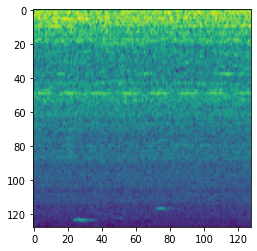

tensor([[1.0000e+00, 8.7532e-10, 8.0533e-12],
        [1.0000e+00, 1.1803e-09, 9.9958e-12],
        [1.0000e+00, 1.8443e-08, 6.2738e-11],
        [1.0000e+00, 1.1176e-09, 5.6587e-12],
        [1.0000e+00, 4.6619e-09, 5.2238e-11],
        [1.0000e+00, 3.1699e-09, 1.2070e-11],
        [1.0000e+00, 3.8171e-10, 2.6897e-12],
        [1.0000e+00, 3.6811e-10, 3.7329e-12],
        [1.0000e+00, 6.4110e-10, 6.5189e-12]], device='cuda:0')


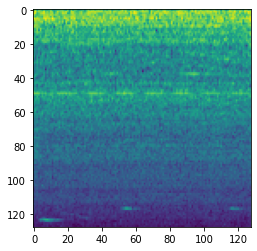

100%|██████████| 456/456 [00:16<00:00, 28.47it/s]
2022-05-22 15:31:08,724 - INFO - anomaly score result ->  ./result/anomaly_score_slider_id_00.csv
2022-05-22 15:31:08,731 - INFO - AUC : 0.7183988764044944
2022-05-22 15:31:08,735 - INFO - pAUC : 0.5856002365464222
2022-05-22 15:31:08,738 - INFO - target_dir : slider_id_02
2022-05-22 15:31:08,747 - INFO - test_file  num : 367



============ END OF TEST FOR A MACHINE ID ============


============== BEGIN TEST FOR A MACHINE ID ==============


  0%|          | 0/367 [00:00<?, ?it/s]/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:69: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.


tensor([[1.0000e+00, 8.4972e-08, 3.4477e-10],
        [1.0000e+00, 2.4879e-07, 3.5317e-10],
        [1.0000e+00, 2.8148e-07, 3.1485e-10],
        [1.0000e+00, 6.9197e-07, 3.4656e-10],
        [1.0000e+00, 1.7459e-07, 5.9676e-10],
        [1.0000e+00, 3.5730e-08, 3.3060e-10],
        [1.0000e+00, 3.4380e-08, 1.5329e-10],
        [1.0000e+00, 5.7265e-09, 1.8154e-11],
        [1.0000e+00, 1.8953e-08, 1.2185e-10]], device='cuda:0')


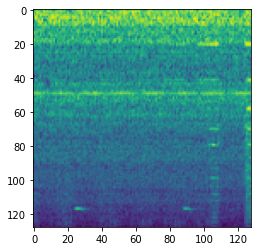

tensor([[1.0000e+00, 8.4972e-08, 3.4477e-10],
        [1.0000e+00, 2.4879e-07, 3.5317e-10],
        [1.0000e+00, 2.8148e-07, 3.1485e-10],
        [1.0000e+00, 6.9197e-07, 3.4656e-10],
        [1.0000e+00, 1.7459e-07, 5.9676e-10],
        [1.0000e+00, 3.5730e-08, 3.3060e-10],
        [1.0000e+00, 3.4380e-08, 1.5329e-10],
        [1.0000e+00, 5.7265e-09, 1.8154e-11],
        [1.0000e+00, 1.8953e-08, 1.2185e-10]], device='cuda:0')


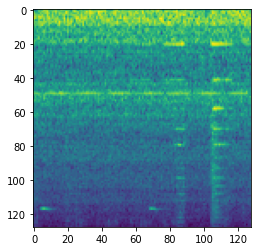

100%|██████████| 367/367 [00:11<00:00, 30.71it/s]
2022-05-22 15:31:20,713 - INFO - anomaly score result ->  ./result/anomaly_score_slider_id_02.csv
2022-05-22 15:31:20,722 - INFO - AUC : 0.6707116104868914
2022-05-22 15:31:20,726 - INFO - pAUC : 0.5186280307510349
2022-05-22 15:31:20,731 - INFO - target_dir : slider_id_04
2022-05-22 15:31:20,742 - INFO - test_file  num : 278



============ END OF TEST FOR A MACHINE ID ============


============== BEGIN TEST FOR A MACHINE ID ==============


  0%|          | 0/278 [00:00<?, ?it/s]/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:69: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.


tensor([[1.0000e+00, 1.1756e-07, 7.9694e-09],
        [1.0000e+00, 6.4242e-08, 1.8068e-09],
        [1.0000e+00, 7.0772e-07, 1.2376e-08],
        [9.9999e-01, 6.3551e-06, 4.8805e-08],
        [1.0000e+00, 4.2227e-07, 2.2223e-09],
        [1.0000e+00, 4.5692e-07, 1.3146e-08],
        [1.0000e+00, 6.3522e-07, 2.7024e-08],
        [1.0000e+00, 8.0030e-08, 7.0019e-10],
        [1.0000e+00, 2.8138e-07, 1.8452e-08]], device='cuda:0')


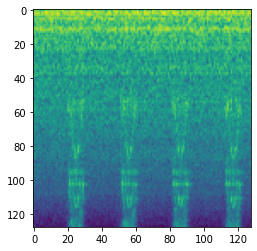

tensor([[1.0000e+00, 1.1756e-07, 7.9694e-09],
        [1.0000e+00, 6.4242e-08, 1.8068e-09],
        [1.0000e+00, 7.0772e-07, 1.2376e-08],
        [9.9999e-01, 6.3551e-06, 4.8805e-08],
        [1.0000e+00, 4.2227e-07, 2.2223e-09],
        [1.0000e+00, 4.5692e-07, 1.3146e-08],
        [1.0000e+00, 6.3522e-07, 2.7024e-08],
        [1.0000e+00, 8.0030e-08, 7.0019e-10],
        [1.0000e+00, 2.8138e-07, 1.8452e-08]], device='cuda:0')


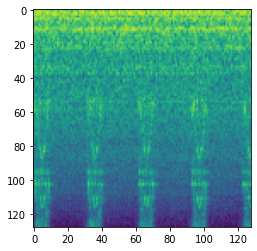

100%|██████████| 278/278 [00:09<00:00, 29.60it/s]
2022-05-22 15:31:30,154 - INFO - anomaly score result ->  ./result/anomaly_score_slider_id_04.csv
2022-05-22 15:31:30,162 - INFO - AUC : 0.49087078651685395
2022-05-22 15:31:30,167 - INFO - pAUC : 0.5069485511531638
2022-05-22 15:31:30,171 - INFO - AUC and pAUC results -> ./result/result.csv



============ END OF TEST FOR A MACHINE ID ============


In [ ]:
def test():
    # make output result directory
    os.makedirs(params.result_directory, exist_ok=True)

    # load base directory
    dirs = com.select_dirs(param=params, mode=params.mode)

    # initialize lines in csv for AUC and pAUC
    csv_lines = []

    # PyTorch version specific...
    to_tensor = pytorch_common.ToTensor1ch()
    device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

    soft = torch.nn.Softmax()

    # loop of the base directory
    for idx, target_dir in enumerate(dirs):
        print("\n===========================")
        print("[{idx}/{total}] {dirname}".format(dirname=target_dir, idx=idx+1, total=len(dirs)))
        machine_type = os.path.split(target_dir)[1]

        print("============== MODEL LOAD ==============")
        # set model path
        model_file = "{model}/model_{machine_type}.pth".format(model=params.model_directory,
                                                               machine_type=machine_type)

        # load model file
        if not os.path.exists(model_file):
            com.logger.error("{} model not found ".format(machine_type))
            sys.exit(-1)
        com.logger.info("loading model: {}".format(model_file))
        model = resnet50.to(device)
        pytorch_common.load_weights(model, model_file)
        torchsummary.summary(model, (1, 128, 128))
        model.eval()

        if params.mode:
            # results by type
            csv_lines.append([machine_type])
            csv_lines.append(["id", "AUC", "pAUC"])
            performance = []

        machine_id_list = get_machine_id_list_for_test(target_dir)

        for id_str in machine_id_list:
            # load test file
            test_files, y_true = test_file_list_generator(target_dir, id_str, mode=params.mode)

            # setup anomaly score file path
            anomaly_score_csv = "{result}/anomaly_score_{machine_type}_{id_str}.csv".format(
                                                                                     result=params.result_directory,
                                                                                     machine_type=machine_type,
                                                                                     id_str=id_str)
            anomaly_score_list = []

            print("\n============== BEGIN TEST FOR A MACHINE ID ==============")
            y_pred = [0. for k in test_files]
            for file_idx, file_path in tqdm(enumerate(test_files), total=len(test_files)):
                data = imgc.file_to_vector_array_2d(file_path,
                                                n_mels=params.feature.n_mels,
                                                n_fft=params.feature.n_fft,
                                                hop_length=params.feature.hop_length,
                                                power=params.feature.power)
                data = pytorch_common.normalize_0to1(data)
                trs = torchvision.transforms.RandomCrop((128, 128))
                data = trs(to_tensor(data))
                with torch.no_grad():
                    yhat = soft(model(data))
                    if file_idx in [0, 500]:
                        for i in range(2):
                            plt.imshow(data[i].squeeze().cpu())
                            print(yhat)
                            plt.show()
                y_pred[file_idx] = (1 - torch.max(yhat)).cpu().detach().numpy()
                anomaly_score_list.append([os.path.basename(file_path), y_pred[file_idx]])

            # save anomaly score
            #anomaly_score_list = [[elem[0], 0] if elem[1] < 0.0005 else [elem[0], 1] for elem in anomaly_score_list]
            #y_pred = [0 if elem < 0.0005 else 1 for elem in y_pred]
            #values = [elem[1] for elem in anomaly_score_list]
            #plt.hist(values)
            #plt.show()
            save_csv(save_file_path=anomaly_score_csv, save_data=anomaly_score_list)
            com.logger.info("anomaly score result ->  {}".format(anomaly_score_csv))

            if params.mode:
                # append AUC and pAUC to lists
                auc = metrics.roc_auc_score(y_true, y_pred)
                p_auc = metrics.roc_auc_score(y_true, y_pred, max_fpr=params.max_fpr)
                csv_lines.append([id_str.split("_", 1)[1], auc, p_auc])
                performance.append([auc, p_auc])
                com.logger.info("AUC : {}".format(auc))
                com.logger.info("pAUC : {}".format(p_auc))

            print("\n============ END OF TEST FOR A MACHINE ID ============")

        if params.mode:
            # calculate averages for AUCs and pAUCs
            averaged_performance = numpy.mean(numpy.array(performance, dtype=float), axis=0)
            csv_lines.append(["Average"] + list(averaged_performance))
            csv_lines.append([])

    if params.mode:
        # output results
        result_path = "{result}/{file_name}".format(result=params.result_directory, file_name=params.result_file)
        com.logger.info("AUC and pAUC results -> {}".format(result_path))
        save_csv(save_file_path=result_path, save_data=csv_lines)

params.mode = True
test()

In [ ]:
def upto_6digits(cell):
    if not cell[0].isdigit(): return cell
    return f'{float(cell):.6f}'

if params.mode:
    with open('./result/result.csv') as f:
        for l in f.readlines():
            l = l.strip() #replace('\n', '')
            if ',' not in l:
                print(l)
                continue
            ls = l.split(',')
            print(f'{ls[0]}\t\t{upto_6digits(ls[1])}\t\t{upto_6digits(ls[2])}')

slider
id		AUC		pAUC
00		0.718399		0.585600
02		0.670712		0.518628
04		0.490871		0.506949
Average		0.626660		0.537059



# Testing on the Evaluation dataset and generating submission file

In [ ]:
# re-training on evaluation dataset
params.mode = False
#train() # due to the memory restriction, restart the kernel and train on only evaluation dataset

2022-05-22 15:31:30,390 - INFO - load_directory <- evaluation
2022-05-22 15:31:30,393 - INFO - loading model: ./model/model_slider.pth



[1/1] /content/data/eval_data/eval_data/slider
============== MODEL LOAD ==============
----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1           [-1, 64, 64, 64]           3,136
       BatchNorm2d-2           [-1, 64, 64, 64]             128
              ReLU-3           [-1, 64, 64, 64]               0
         MaxPool2d-4           [-1, 64, 32, 32]               0
            Conv2d-5           [-1, 64, 32, 32]           4,096
       BatchNorm2d-6           [-1, 64, 32, 32]             128
              ReLU-7           [-1, 64, 32, 32]               0
            Conv2d-8           [-1, 64, 32, 32]          36,864
       BatchNorm2d-9           [-1, 64, 32, 32]             128
             ReLU-10           [-1, 64, 32, 32]               0
           Conv2d-11          [-1, 256, 32, 32]          16,384
      BatchNorm2d-12          [-1, 256, 32, 32]             512
           Con

2022-05-22 15:31:30,638 - INFO - target_dir : slider_id_01
2022-05-22 15:31:30,642 - INFO - test_file  num : 278


          Conv2d-121            [-1, 256, 8, 8]         262,144
     BatchNorm2d-122            [-1, 256, 8, 8]             512
            ReLU-123            [-1, 256, 8, 8]               0
          Conv2d-124            [-1, 256, 8, 8]         589,824
     BatchNorm2d-125            [-1, 256, 8, 8]             512
            ReLU-126            [-1, 256, 8, 8]               0
          Conv2d-127           [-1, 1024, 8, 8]         262,144
     BatchNorm2d-128           [-1, 1024, 8, 8]           2,048
            ReLU-129           [-1, 1024, 8, 8]               0
      Bottleneck-130           [-1, 1024, 8, 8]               0
          Conv2d-131            [-1, 256, 8, 8]         262,144
     BatchNorm2d-132            [-1, 256, 8, 8]             512
            ReLU-133            [-1, 256, 8, 8]               0
          Conv2d-134            [-1, 256, 8, 8]         589,824
     BatchNorm2d-135            [-1, 256, 8, 8]             512
            ReLU-136            [-1, 256

  0%|          | 0/278 [00:00<?, ?it/s]

tensor([[4.8921e-01, 3.6930e-06, 5.1079e-01],
        [9.9116e-01, 4.5948e-07, 8.8422e-03],
        [9.9687e-01, 1.7721e-08, 3.1295e-03],
        [9.7523e-01, 1.7751e-07, 2.4767e-02],
        [2.2609e-02, 6.6105e-07, 9.7739e-01],
        [9.0948e-01, 2.3409e-07, 9.0518e-02],
        [9.1519e-01, 3.0830e-07, 8.4807e-02],
        [9.4869e-01, 2.3048e-07, 5.1309e-02],
        [9.6362e-01, 2.2317e-07, 3.6382e-02]], device='cuda:0')


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:69: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.


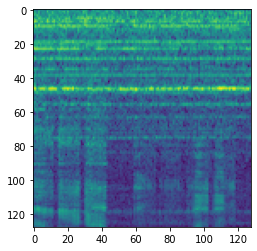

tensor([[4.8921e-01, 3.6930e-06, 5.1079e-01],
        [9.9116e-01, 4.5948e-07, 8.8422e-03],
        [9.9687e-01, 1.7721e-08, 3.1295e-03],
        [9.7523e-01, 1.7751e-07, 2.4767e-02],
        [2.2609e-02, 6.6105e-07, 9.7739e-01],
        [9.0948e-01, 2.3409e-07, 9.0518e-02],
        [9.1519e-01, 3.0830e-07, 8.4807e-02],
        [9.4869e-01, 2.3048e-07, 5.1309e-02],
        [9.6362e-01, 2.2317e-07, 3.6382e-02]], device='cuda:0')


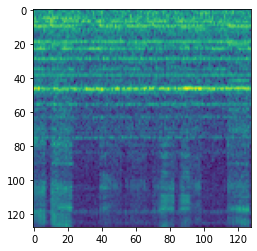

100%|██████████| 278/278 [00:09<00:00, 29.03it/s]
2022-05-22 15:31:40,229 - INFO - anomaly score result ->  ./result/anomaly_score_slider_id_01.csv
2022-05-22 15:31:40,233 - INFO - target_dir : slider_id_03
2022-05-22 15:31:40,241 - INFO - test_file  num : 278



============ END OF TEST FOR A MACHINE ID ============


============== BEGIN TEST FOR A MACHINE ID ==============


  0%|          | 0/278 [00:00<?, ?it/s]

tensor([[1.5189e-04, 9.9623e-01, 3.6131e-03],
        [7.3989e-04, 8.3005e-01, 1.6921e-01],
        [3.2345e-04, 9.7926e-01, 2.0412e-02],
        [4.4966e-05, 9.9663e-01, 3.3230e-03],
        [5.5732e-05, 9.9771e-01, 2.2364e-03],
        [1.9251e-05, 9.9965e-01, 3.3349e-04],
        [3.1418e-05, 9.9991e-01, 6.0677e-05],
        [2.0991e-05, 9.8334e-01, 1.6641e-02],
        [1.1335e-03, 9.7789e-01, 2.0980e-02]], device='cuda:0')


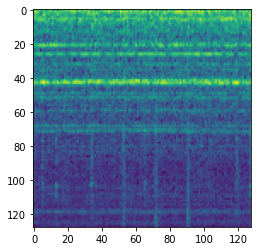

tensor([[1.5189e-04, 9.9623e-01, 3.6131e-03],
        [7.3989e-04, 8.3005e-01, 1.6921e-01],
        [3.2345e-04, 9.7926e-01, 2.0412e-02],
        [4.4966e-05, 9.9663e-01, 3.3230e-03],
        [5.5732e-05, 9.9771e-01, 2.2364e-03],
        [1.9251e-05, 9.9965e-01, 3.3349e-04],
        [3.1418e-05, 9.9991e-01, 6.0677e-05],
        [2.0991e-05, 9.8334e-01, 1.6641e-02],
        [1.1335e-03, 9.7789e-01, 2.0980e-02]], device='cuda:0')


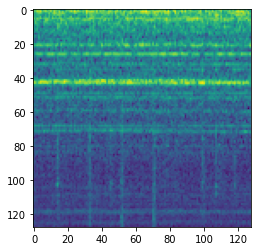

100%|██████████| 278/278 [00:09<00:00, 30.87it/s]
2022-05-22 15:31:49,266 - INFO - anomaly score result ->  ./result/anomaly_score_slider_id_03.csv
2022-05-22 15:31:49,271 - INFO - target_dir : slider_id_05
2022-05-22 15:31:49,278 - INFO - test_file  num : 278



============ END OF TEST FOR A MACHINE ID ============


============== BEGIN TEST FOR A MACHINE ID ==============


  0%|          | 0/278 [00:00<?, ?it/s]

tensor([[3.1596e-08, 2.5293e-06, 1.0000e+00],
        [3.1642e-07, 3.1223e-06, 1.0000e+00],
        [3.3509e-07, 5.1012e-06, 9.9999e-01],
        [5.4608e-07, 5.4048e-06, 9.9999e-01],
        [2.5076e-07, 1.4638e-05, 9.9999e-01],
        [7.5256e-08, 6.8706e-06, 9.9999e-01],
        [1.9338e-07, 3.5337e-05, 9.9996e-01],
        [3.2906e-08, 1.6393e-06, 1.0000e+00],
        [1.6660e-07, 5.1395e-06, 9.9999e-01]], device='cuda:0')


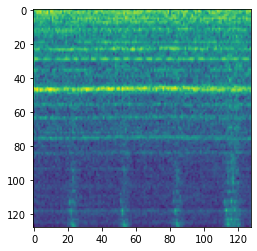

tensor([[3.1596e-08, 2.5293e-06, 1.0000e+00],
        [3.1642e-07, 3.1223e-06, 1.0000e+00],
        [3.3509e-07, 5.1012e-06, 9.9999e-01],
        [5.4608e-07, 5.4048e-06, 9.9999e-01],
        [2.5076e-07, 1.4638e-05, 9.9999e-01],
        [7.5256e-08, 6.8706e-06, 9.9999e-01],
        [1.9338e-07, 3.5337e-05, 9.9996e-01],
        [3.2906e-08, 1.6393e-06, 1.0000e+00],
        [1.6660e-07, 5.1395e-06, 9.9999e-01]], device='cuda:0')


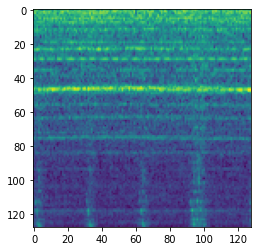

100%|██████████| 278/278 [00:09<00:00, 28.57it/s]
2022-05-22 15:31:59,027 - INFO - anomaly score result ->  ./result/anomaly_score_slider_id_05.csv



============ END OF TEST FOR A MACHINE ID ============


In [ ]:
test()

In [ ]:
import numpy as np
import pandas as pd

df1 = pd.read_csv('./result/anomaly_score_slider_id_01.csv', delimiter=',', header=None)
df3 = pd.read_csv('./result/anomaly_score_slider_id_03.csv', delimiter=',', header=None)
df5 = pd.read_csv('./result/anomaly_score_slider_id_05.csv', delimiter=',', header=None)

dfs = [df1, df3, df5]
eval_df = pd.concat(dfs)
eval_df = eval_df.rename(columns={0: "file_name", 1: "anomaly_score"})

eval_df.to_csv('./result/baseline_submission_resnet50.csv',index = False)


In [ ]:
eval_df.head()

,file_name,anomaly_score
0,id_01_00000000.wav,0.003129
1,id_01_00000001.wav,0.001316
2,id_01_00000002.wav,0.000000
3,id_01_00000003.wav,0.006222
4,id_01_00000004.wav,0.000016


# **FOLLOWING IS THE CODE FOR THE THREE MODEL ARCHITECTURE**

**Since most of the code is rewritten we figured out it was best to just joine the whole thing in the same notebook.**

# Network

The implementation of the Variational Auto-Encoder (VAE) model.

In [ ]:
class VAE(nn.Module):
    """Mostly borrowed from PyTorch example.
    Thanks to https://github.com/pytorch/examples/blob/master/vae/main.py
    """

    def __init__(self, device, x_dim=640, h_dim=400, z_dim=20):
        super().__init__()
        self.x_dim = x_dim

        self.fc11 = nn.Linear(x_dim, h_dim)
        self.fc12 = nn.Linear(h_dim, h_dim)
        self.fc21 = nn.Linear(h_dim, z_dim)
        self.fc22 = nn.Linear(h_dim, z_dim)
        self.fc31 = nn.Linear(z_dim, h_dim)
        self.fc32 = nn.Linear(h_dim, h_dim)
        self.fc4 = nn.Linear(h_dim, x_dim)

    def encode(self, x):
        x = F.relu(self.fc11(x))
        x = F.relu(self.fc12(x))
        return self.fc21(x), self.fc22(x)

    def reparameterize(self, mu, logvar):
        std = torch.exp(0.5*logvar)
        eps = torch.randn_like(std)
        return mu + eps*std

    def decode(self, z):
        h = F.relu(self.fc31(z))
        h = F.relu(self.fc32(h))
        return torch.sigmoid(self.fc4(h))

    def forward_all(self, x):
        mu, logvar = self.encode(x.view(-1, self.x_dim))
        z = self.reparameterize(mu, logvar)
        return self.decode(z), z, mu, logvar

    def forward(self, x):
        yhat, _, _, _ = self.forward_all(x)
        return yhat


def VAE_loss_function(recon_x, x, mu, logvar, reconst_loss='mse', a_RECONST=1., a_KLD=1., x_dim=640):
    """Loss function for VAE which consists of reconstruction and KL divergence losses.
    Thanks to https://github.com/pytorch/examples/blob/master/vae/main.py

    You can also balance weights for each loss, just to see what if KLD loss is stronger, etc.

    Args:
        reconst_loss: Reconstruction loss calculation: 'mse' or 'bce'
        a_RECONST: Weight for reconstruction loss.
        a_KLD: Weight for KLD loss.
    """

    func = (F.mse_loss if reconst_loss == 'mse'
            else F.binary_cross_entropy if reconst_loss == 'bce'
            else 'Unknown reconst_loss')
    RECONST = func(recon_x, x.view(-1, x_dim), reduction='sum')

    # see Appendix B from VAE paper:
    # Kingma and Welling. Auto-Encoding Variational Bayes. ICLR, 2014
    # https://arxiv.org/abs/1312.6114
    # 0.5 * sum(1 + log(sigma^2) - mu^2 - sigma^2)
    KLD = -0.5 * torch.sum(1 + logvar - mu.pow(2) - logvar.exp())

    return RECONST*a_RECONST + KLD*a_KLD


# Parameters

In [ ]:
params = {
# inout directory
"dev_directory" : "data/dev_data/dev_data",
"eval_directory" : "data/eval_data/eval_data",
"model_directory": "./model",
"result_directory": "./result",
"result_file": "result.csv",
"max_fpr" : 0.1,
"mode" : True, # mode=True for development dataset, mode=False for evaluation dataset

# preprocessing for mel-spectrogram
"feature": {
"n_mels": 128,
"frames" : 5,
"n_fft": 1024,
"hop_length": 512,
"power": 2.0},

# training
"fit":{
"lr": 0.001,
"b1": 0.9,
"b2": 0.999,
"weight_decay": 0.0,
"epochs" : 70,
"batch_size" : 1000,
"shuffle" : True,
"validation_split" : 0.1,
"verbose" : 1},
    
# model architecture
"VAE":{
"x_dim": 640,
"h_dim": 400,
"z_dim": 20}
    
}
params = EasyDict(params)

# create working directory
ensure_folder(params.model_directory)

# test directories
dirs = com.select_dirs(param=params, mode=params.mode)

# fix random seeds
deterministic_everything(2020, pytorch=True)

# PyTorch device
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

2022-05-22 09:45:49,253 - INFO - load_directory <- development


# Training

In [ ]:
class Task2Dataset(torch.utils.data.Dataset):
    """PyTorch dataset class for task2. Caching to a file supported.

    Args:
        n_mels, frames, n_fft, hop_length, power, transform: Audio conversion settings.
        normalize: Normalize data value range from [-90, 24] to [0, 1] for VAE, False by default.
        cache_to: Cache filename or None by default, use this for your iterative development.
    """

    def __init__(self, files, n_mels, frames, n_fft, hop_length, power, transform,
                 normalize=False, cache_to=None):
        self.transform = transform
        self.files = files
        self.n_mels, self.frames, self.n_fft = n_mels, frames, n_fft
        self.hop_length, self.power = hop_length, power
        # load cache or convert all the data for the first time
        if cache_to is not None and Path(cache_to).exists():
            com.logger.info(f'Loading cached {Path(cache_to).name}')
            self.X = np.load(cache_to)
        else:
            self.X = com.list_to_vector_array(self.files,
                             n_mels=self.n_mels,
                             frames=self.frames,
                             n_fft=self.n_fft,
                             hop_length=self.hop_length,
                             power=self.power)
            if cache_to is not None:
                np.save(cache_to, self.X)

        if normalize:
            self.X = normalize_0to1(self.X)

    def __len__(self):
        return len(self.X)

    def __getitem__(self, index):
        x = self.X[index]
        x = self.transform(x)
        return x, x


# VAE Training class
class Task2VAELightning(pl.LightningModule):
    """Task2 PyTorch Lightning class, for training only."""

    def __init__(self, device, model, params, files, normalize=False):
        super().__init__()
        self.params = params
        self.normalize = normalize
        self.model = model
        self.mseloss = torch.nn.MSELoss()
        # split data files
        if files is not None:
            n_val = int(params.fit.validation_split * len(files))
            self.val_files = random.sample(files, n_val)
            self.train_files = [f for f in files if f not in self.val_files]

    def forward(self, x):
        return self.model(x)
    
    def training_step(self, batch, batch_nb):
        x, y = batch
        y_hat, z, mu, logvar = self.model.forward_all(x)
        loss = VAE_loss_function(recon_x=y_hat, x=x, mu=mu, logvar=logvar,
                                 reconst_loss='mse',
                                 a_RECONST=1.,
                                 a_KLD=.01)
        tensorboard_logs = {'train_loss': loss}
        return {'loss': loss, 'log': tensorboard_logs}

    def validation_step(self, batch, batch_nb):
        x, y = batch
        y_hat = self.forward(x)
        return {'val_loss': self.mseloss(y_hat, y)}

    def validation_epoch_end(self, outputs):
        avg_loss = torch.stack([x['val_loss'] for x in outputs]).mean()
        tensorboard_logs = {'val_loss': avg_loss}
        return {'avg_val_loss': avg_loss, 'log': tensorboard_logs}

    def configure_optimizers(self):
        return torch.optim.Adam(self.parameters(), lr=self.params.fit.lr,
                                betas=(self.params.fit.b1, self.params.fit.b2),
                                weight_decay=self.params.fit.weight_decay)

    def _get_dl(self, for_what):
        files = self.train_files if for_what == 'train' else self.val_files
        cache_file = f'{self.params.model_directory}/__cache_{str(files[0]).split("/")[-3]}_{for_what}.npy'
        ds = Task2Dataset(files,
                          n_mels=self.params.feature.n_mels,
                          frames=self.params.feature.frames,
                          n_fft=self.params.feature.n_fft,
                          hop_length=self.params.feature.hop_length,
                          power=self.params.feature.power,
                          transform=ToTensor1ch(device=device),
                          normalize=self.normalize,
                          cache_to=cache_file)
        return torch.utils.data.DataLoader(ds, batch_size=self.params.fit.batch_size,
                          shuffle=(self.params.fit.shuffle if for_what == 'train' else False))

    def train_dataloader(self):
        return self._get_dl('train')

    def val_dataloader(self):
        return self._get_dl('val')

In [ ]:
# train models

def train():
    print(dirs)
    for target_dir in dirs:
        target = str(target_dir).split('/')[-1]
        print(f'==== Start training [{target}] with {torch.cuda.device_count()} GPU(s). ====')
        #files = com.file_list_generator(target_dir)
        dir_eval = '/content/data/eval_data/eval_data/slider'
        files = com.file_list_generator(dir_eval)
        files00 = [x for x in files if "id_01" in x]
        files02 = [x for x in files if "id_03" in x]
        files04 = [x for x in files if "id_05" in x]

        print(files00)
        print(files02)
        print(files04)

        model00 = VAE(device, x_dim=params.VAE.x_dim, h_dim=params.VAE.h_dim, z_dim=params.VAE.z_dim).to(device)
        summary(device, model00)
        task200 = Task2VAELightning(device, model00, params, files00, normalize=True)
        trainer00 = pl.Trainer(max_epochs=params.fit.epochs,
                             gpus=torch.cuda.device_count())
        trainer00.fit(task200)

        model_file = f'{params.model_directory}/model_00.pth'
        torch.save(task200.model.state_dict(), model_file)
        print(f'saved {model_file}.\n')
        
        model02 = VAE(device, x_dim=params.VAE.x_dim, h_dim=params.VAE.h_dim, z_dim=params.VAE.z_dim).to(device)
        summary(device, model02)
        task202 = Task2VAELightning(device, model02, params, files02, normalize=True)
        trainer02 = pl.Trainer(max_epochs=params.fit.epochs,
                             gpus=torch.cuda.device_count())
        trainer02.fit(task202)

        model_file = f'{params.model_directory}/model_02.pth'
        torch.save(task202.model.state_dict(), model_file)
        print(f'saved {model_file}.\n')

        model04 = VAE(device, x_dim=params.VAE.x_dim, h_dim=params.VAE.h_dim, z_dim=params.VAE.z_dim).to(device)
        summary(device, model04)
        task2 = Task2VAELightning(device, model04, params, files04, normalize=True)
        trainer = pl.Trainer(max_epochs=params.fit.epochs,
                             gpus=torch.cuda.device_count())
        trainer.fit(task2)

        model_file = f'{params.model_directory}/model_04.pth'
        torch.save(task2.model.state_dict(), model_file)
        print(f'saved {model_file}.\n')
        
train()

2022-05-22 09:47:09,396 - INFO - target_dir : eval_data/slider
2022-05-22 09:47:09,407 - INFO - # of training samples : 2370


['/content/data/dev_data/dev_data/slider']
==== Start training [slider] with 1 GPU(s). ====
['/content/data/eval_data/eval_data/slider/train/normal_id_01_00000000.wav', '/content/data/eval_data/eval_data/slider/train/normal_id_01_00000001.wav', '/content/data/eval_data/eval_data/slider/train/normal_id_01_00000002.wav', '/content/data/eval_data/eval_data/slider/train/normal_id_01_00000003.wav', '/content/data/eval_data/eval_data/slider/train/normal_id_01_00000004.wav', '/content/data/eval_data/eval_data/slider/train/normal_id_01_00000005.wav', '/content/data/eval_data/eval_data/slider/train/normal_id_01_00000006.wav', '/content/data/eval_data/eval_data/slider/train/normal_id_01_00000007.wav', '/content/data/eval_data/eval_data/slider/train/normal_id_01_00000008.wav', '/content/data/eval_data/eval_data/slider/train/normal_id_01_00000009.wav', '/content/data/eval_data/eval_data/slider/train/normal_id_01_00000010.wav', '/content/data/eval_data/eval_data/slider/train/normal_id_01_00000011.w

Sanity Checking: 0it [00:00, ?it/s]

calc...:   0%|          | 0/96 [00:00<?, ?it/s]

2022-05-22 09:47:22,460 - INFO - Creating data for 96 files: size=29664, shape=(640,)
/usr/local/lib/python3.7/dist-packages/pytorch_lightning/trainer/connectors/data_connector.py:245: PossibleUserWarning: The dataloader, val_dataloader 0, does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` (try 4 which is the number of cpus on this machine) in the `DataLoader` init to improve performance.
  category=PossibleUserWarning,
/usr/local/lib/python3.7/dist-packages/torch/nn/modules/loss.py:529: UserWarning: Using a target size (torch.Size([1000, 1, 640])) that is different to the input size (torch.Size([1000, 640])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


calc...:   0%|          | 0/872 [00:00<?, ?it/s]

2022-05-22 09:47:25,228 - INFO - Creating data for 872 files: size=269448, shape=(640,)
/usr/local/lib/python3.7/dist-packages/pytorch_lightning/trainer/connectors/data_connector.py:245: PossibleUserWarning: The dataloader, train_dataloader, does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` (try 4 which is the number of cpus on this machine) in the `DataLoader` init to improve performance.
  category=PossibleUserWarning,


Training: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/loss.py:529: UserWarning: Using a target size (torch.Size([664, 1, 640])) that is different to the input size (torch.Size([664, 640])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

saved ./model/model_00.pth.

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Linear-1                  [-1, 400]         256,400
            Linear-2                  [-1, 400]         160,400
            Linear-3                   [-1, 20]           8,020
            Linear-4                   [-1, 20]           8,020
            Linear-5                  [-1, 400]           8,400
            Linear-6                  [-1, 400]         160,400
            Linear-7                  [-1, 640]         256,640
Total params: 858,280
Trainable params: 858,280
Non-trainable params: 0
----------------------------------------------------------------
Input size (MB): 0.00
Forward/backward pass size (MB): 0.02
Params size (MB): 3.27
Estimated Total Size (MB): 3.29
----------------------------------------------------------------


Sanity Checking: 0it [00:00, ?it/s]

2022-05-22 10:08:11,800 - INFO - Loading cached __cache_slider_val.npy
2022-05-22 10:08:12,143 - INFO - Loading cached __cache_slider_train.npy


Training: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

saved ./model/model_02.pth.

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Linear-1                  [-1, 400]         256,400
            Linear-2                  [-1, 400]         160,400
            Linear-3                   [-1, 20]           8,020
            Linear-4                   [-1, 20]           8,020
            Linear-5                  [-1, 400]           8,400
            Linear-6                  [-1, 400]         160,400
            Linear-7                  [-1, 640]         256,640
Total params: 858,280
Trainable params: 858,280
Non-trainable params: 0
----------------------------------------------------------------
Input size (MB): 0.00
Forward/backward pass size (MB): 0.02
Params size (MB): 3.27
Estimated Total Size (MB): 3.29
----------------------------------------------------------------


Sanity Checking: 0it [00:00, ?it/s]

2022-05-22 10:28:29,321 - INFO - Loading cached __cache_slider_val.npy
2022-05-22 10:28:29,658 - INFO - Loading cached __cache_slider_train.npy


Training: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

saved ./model/model_04.pth.



In [ ]:
# model_file = f'{params.model_directory}/model_04.pth'
# torch.save(task2.model.state_dict(), model_file)

# model_file = f'{params.model_directory}/model_02.pth'
# torch.save(task202.model.state_dict(), model_file)
           
# model_file = f'{params.model_directory}/model_00.pth'
# torch.save(task200.model.state_dict(), model_file)

# Testing on Development dataset

In [ ]:
def test():
    # make output result directory
    os.makedirs(params.result_directory, exist_ok=True)

    # load base directory
    dirs = com.select_dirs(param=params, mode=params.mode)
    target_dir = dirs[0]
    print("TARGET DIR", target_dir, dirs) 
    # initialize lines in csv for AUC and pAUC
    csv_lines = []

    # PyTorch version specific...
    to_tensor = pytorch_common.ToTensor1ch()
    device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

    # loop of the base directory
    for model_id in ["00", "02", "04"]:
        print("\n===========================")
        #print("[{idx}/{total}] {dirname}".format(dirname=target_dir, idx=idx+1, total=len(dirs)))
        machine_type = os.path.split(target_dir)[1]

        print("============== MODEL LOAD ==============")
        # set model path
        model_file = "{model}/model_{machine_type}.pth".format(model=params.model_directory,
                                                               machine_type=model_id)

        # load model file
        if not os.path.exists(model_file):
            com.logger.error("{} model not found ".format(machine_type))
            sys.exit(-1)
        com.logger.info("loading model: {}".format(model_file))
        model = VAE(device, x_dim=params.VAE.x_dim, h_dim=params.VAE.h_dim, z_dim=params.VAE.z_dim).to(device)
        pytorch_common.load_weights(model, model_file)
        pytorch_common.summary(device, model)
        model.eval()

        if params.mode:
            # results by type
            csv_lines.append([machine_type])
            csv_lines.append(["id", "AUC", "pAUC"])
            performance = []

        machine_id_list = get_machine_id_list_for_test(target_dir)

        for id_str in machine_id_list:
            # load test file
            test_files, y_true = test_file_list_generator(target_dir, id_str, mode=params.mode)

            # setup anomaly score file path
            anomaly_score_csv = "{result}/anomaly_score_{machine_type}_{id_str}_{model}.csv".format(
                                                                                     result=params.result_directory,
                                                                                     machine_type=machine_type,
                                                                                     id_str=id_str,
                                                                                     model=model_id)
            anomaly_score_list = []

            print("\n============== BEGIN TEST FOR A MACHINE ID ==============")
            y_pred = [0. for k in test_files]
            for file_idx, file_path in tqdm(enumerate(test_files), total=len(test_files)):
                try:
                    data = com.file_to_vector_array(file_path,
                                                    n_mels=params.feature.n_mels,
                                                    frames=params.feature.frames,
                                                    n_fft=params.feature.n_fft,
                                                    hop_length=params.feature.hop_length,
                                                    power=params.feature.power)
                    data = pytorch_common.normalize_0to1(data)
                    with torch.no_grad():
                        yhat = model(to_tensor(data)).cpu().detach().numpy().reshape(data.shape)
                        errors = numpy.mean(numpy.square(data - yhat), axis=1)
                    y_pred[file_idx] = numpy.mean(errors)
                    anomaly_score_list.append([os.path.basename(file_path), y_pred[file_idx]])
                except:
                    com.logger.error("file broken!!: {}".format(file_path))
                    sys.exit(-1)

            # save anomaly score
            save_csv(save_file_path=anomaly_score_csv, save_data=anomaly_score_list)
            com.logger.info("anomaly score result ->  {}".format(anomaly_score_csv))

            if params.mode:
                # append AUC and pAUC to lists
                auc = metrics.roc_auc_score(y_true, y_pred)
                p_auc = metrics.roc_auc_score(y_true, y_pred, max_fpr=params.max_fpr)
                csv_lines.append([id_str.split("_", 1)[1], auc, p_auc])
                performance.append([auc, p_auc])
                com.logger.info("AUC : {}".format(auc))
                com.logger.info("pAUC : {}".format(p_auc))

            print("\n============ END OF TEST FOR A MACHINE ID ============")

        if params.mode:
            # calculate averages for AUCs and pAUCs
            averaged_performance = numpy.mean(numpy.array(performance, dtype=float), axis=0)
            csv_lines.append(["Average"] + list(averaged_performance))
            csv_lines.append([])

    if params.mode:
        # output results
        result_path = "{result}/{file_name}".format(result=params.result_directory, file_name=params.result_file)
        com.logger.info("AUC and pAUC results -> {}".format(result_path))
        save_csv(save_file_path=result_path, save_data=csv_lines)

test()

2022-05-22 09:45:49,711 - INFO - load_directory <- development
2022-05-22 09:45:49,715 - ERROR - slider model not found 


TARGET DIR /content/data/dev_data/dev_data/slider ['/content/data/dev_data/dev_data/slider']

============== MODEL LOAD ==============


SystemExit: ignored

/usr/local/lib/python3.7/dist-packages/IPython/core/interactiveshell.py:2890: UserWarning: To exit: use 'exit', 'quit', or Ctrl-D.
  warn("To exit: use 'exit', 'quit', or Ctrl-D.", stacklevel=1)


In [ ]:
from pytorch_common import test_file_list_generator
def test():
    # make output result directory
    os.makedirs(params.result_directory, exist_ok=True)

    # load base directory
    dirs = com.select_dirs(param=params, mode=params.mode)
    target_dir = dirs[0]
    print("TARGET DIR", target_dir)

    # initialize lines in csv for AUC and pAUC
    csv_lines = []

    # PyTorch version specific...
    to_tensor = pytorch_common.ToTensor1ch()
    device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
    machine_list = []
    if params.mode:
      machine_list = ["00", "02", "04"]
    else:
      machine_list = ["01", "03", "05"]

    # loop of the base directory
    for machine, model in zip(machine_list, ["00", "02", "04"]):
        print("\n===========================")
        #print("[{idx}/{total}] {dirname}".format(dirname=target_dir, idx=idx+1, total=len(dirs)))
        #machine_type = os.path.split(target_dir)[1]

        print("============== MODEL LOAD ==============")
        # set model path
        model_file = "{model}/model_{machine_type}.pth".format(model=params.model_directory,
                                                               machine_type=model)

        # load model file
        if not os.path.exists(model_file):
            com.logger.error("{} model not found ".format(machine))
            sys.exit(-1)
        com.logger.info("loading model: {}".format(model_file))
        model = VAE(device, x_dim=params.VAE.x_dim, h_dim=params.VAE.h_dim, z_dim=params.VAE.z_dim).to(device)
        pytorch_common.load_weights(model, model_file)
        pytorch_common.summary(device, model)
        model.eval()

        if params.mode:
            # results by machine_model
            csv_lines.append([machine])
            csv_lines.append(["id", "AUC", "pAUC"])
            performance = []

        # machine_id_list = get_machine_id_list_for_test(target_dir)
        # print("MACHINEIDLIST:", machine_id_list)

        # load test file
        print("TARGET DIR", target_dir, machine, params.mode)
        machine_id = "id_" + machine
        test_files, y_true = test_file_list_generator(target_dir, machine_id, mode=params.mode)
        
        print("TEST_FILES",test_files)
        print("TRUE", y_true)
        # setup anomaly score file path
        anomaly_score_csv = "{result}/anomaly_score_{machine_type}.csv".format(
                                                                                  result=params.result_directory,
                                                                                  machine_type=machine)
        anomaly_score_list = []

        print("\n============== BEGIN TEST FOR A MACHINE ID ==============")
        y_pred = [0. for k in test_files]
        for file_idx, file_path in tqdm(enumerate(test_files), total=len(test_files)):
            try:
                data = com.file_to_vector_array(file_path,
                                                n_mels=params.feature.n_mels,
                                                frames=params.feature.frames,
                                                n_fft=params.feature.n_fft,
                                                hop_length=params.feature.hop_length,
                                                power=params.feature.power)
                data = pytorch_common.normalize_0to1(data)
                with torch.no_grad():
                    yhat = model(to_tensor(data)).cpu().detach().numpy().reshape(data.shape)
                    errors = numpy.mean(numpy.square(data - yhat), axis=1)
                y_pred[file_idx] = numpy.mean(errors)
                anomaly_score_list.append([os.path.basename(file_path), y_pred[file_idx]])
            except:
                com.logger.error("file broken!!: {}".format(file_path))
                sys.exit(-1)

        # save anomaly score
        save_csv(save_file_path=anomaly_score_csv, save_data=anomaly_score_list)
        com.logger.info("anomaly score result ->  {}".format(anomaly_score_csv))

        if params.mode:
            # append AUC and pAUC to lists
            auc = metrics.roc_auc_score(y_true, y_pred)
            p_auc = metrics.roc_auc_score(y_true, y_pred, max_fpr=params.max_fpr)
            csv_lines.append([machine, auc, p_auc])
            performance.append([auc, p_auc])
            com.logger.info("AUC : {}".format(auc))
            com.logger.info("pAUC : {}".format(p_auc))

        print("\n============ END OF TEST FOR A MACHINE ID ============")

        if params.mode:
            # calculate averages for AUCs and pAUCs
            averaged_performance = numpy.mean(numpy.array(performance, dtype=float), axis=0)
            csv_lines.append(["Average"] + list(averaged_performance))
            csv_lines.append([])

    if params.mode:
        # output results
        result_path = "{result}/{file_name}".format(result=params.result_directory, file_name=params.result_file)
        com.logger.info("AUC and pAUC results -> {}".format(result_path))
        save_csv(save_file_path=result_path, save_data=csv_lines)

#test()

In [ ]:
def upto_6digits(cell):
    if not cell[0].isdigit(): return cell
    return f'{float(cell):.6f}'

if params.mode:
    with open('./result/result.csv') as f:
        for l in f.readlines():
            l = l.strip() #replace('\n', '')
            if ',' not in l:
                print(l)
                continue
            ls = l.split(',')
            print(f'{ls[0]}\t\t{upto_6digits(ls[1])}\t\t{upto_6digits(ls[2])}')

# Testing on the Evaluation dataset and generating submission file

In [ ]:
# re-training on evaluation dataset
params.mode = False
# train() # due to the memory restriction, restart the kernel and train on only evaluation dataset

In [ ]:
test()

2022-05-22 10:55:15,260 - INFO - load_directory <- evaluation
2022-05-22 10:55:15,264 - INFO - loading model: ./model/model_00.pth
2022-05-22 10:55:15,289 - INFO - target_dir : /content/data/eval_data/eval_data/slider_id_01
2022-05-22 10:55:15,302 - INFO - test_file  num : 278


TARGET DIR /content/data/eval_data/eval_data/slider

============== MODEL LOAD ==============
----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Linear-1                  [-1, 400]         256,400
            Linear-2                  [-1, 400]         160,400
            Linear-3                   [-1, 20]           8,020
            Linear-4                   [-1, 20]           8,020
            Linear-5                  [-1, 400]           8,400
            Linear-6                  [-1, 400]         160,400
            Linear-7                  [-1, 640]         256,640
Total params: 858,280
Trainable params: 858,280
Non-trainable params: 0
----------------------------------------------------------------
Input size (MB): 0.00
Forward/backward pass size (MB): 0.02
Params size (MB): 3.27
Estimated Total Size (MB): 3.29
----------------------------------------------------------------
TARGET DIR /

100%|██████████| 278/278 [00:06<00:00, 45.74it/s]
2022-05-22 10:55:21,390 - INFO - anomaly score result ->  ./result/anomaly_score_01.csv
2022-05-22 10:55:21,394 - INFO - loading model: ./model/model_02.pth
2022-05-22 10:55:21,439 - INFO - target_dir : /content/data/eval_data/eval_data/slider_id_03
2022-05-22 10:55:21,445 - INFO - test_file  num : 278



============ END OF TEST FOR A MACHINE ID ============

============== MODEL LOAD ==============
----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Linear-1                  [-1, 400]         256,400
            Linear-2                  [-1, 400]         160,400
            Linear-3                   [-1, 20]           8,020
            Linear-4                   [-1, 20]           8,020
            Linear-5                  [-1, 400]           8,400
            Linear-6                  [-1, 400]         160,400
            Linear-7                  [-1, 640]         256,640
Total params: 858,280
Trainable params: 858,280
Non-trainable params: 0
----------------------------------------------------------------
Input size (MB): 0.00
Forward/backward pass size (MB): 0.02
Params size (MB): 3.27
Estimated Total Size (MB): 3.29
----------------------------------------------------------------
TARGET D

100%|██████████| 278/278 [00:05<00:00, 52.28it/s]
2022-05-22 10:55:26,775 - INFO - anomaly score result ->  ./result/anomaly_score_03.csv
2022-05-22 10:55:26,779 - INFO - loading model: ./model/model_04.pth
2022-05-22 10:55:26,813 - INFO - target_dir : /content/data/eval_data/eval_data/slider_id_05
2022-05-22 10:55:26,818 - INFO - test_file  num : 278



============ END OF TEST FOR A MACHINE ID ============

============== MODEL LOAD ==============
----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Linear-1                  [-1, 400]         256,400
            Linear-2                  [-1, 400]         160,400
            Linear-3                   [-1, 20]           8,020
            Linear-4                   [-1, 20]           8,020
            Linear-5                  [-1, 400]           8,400
            Linear-6                  [-1, 400]         160,400
            Linear-7                  [-1, 640]         256,640
Total params: 858,280
Trainable params: 858,280
Non-trainable params: 0
----------------------------------------------------------------
Input size (MB): 0.00
Forward/backward pass size (MB): 0.02
Params size (MB): 3.27
Estimated Total Size (MB): 3.29
----------------------------------------------------------------
TARGET D

100%|██████████| 278/278 [00:05<00:00, 51.62it/s]
2022-05-22 10:55:32,216 - INFO - anomaly score result ->  ./result/anomaly_score_05.csv



============ END OF TEST FOR A MACHINE ID ============


In [ ]:
import numpy as np
import pandas as pd

# df1_00 = pd.read_csv('./result/anomaly_score_slider_id_01_00.csv', delimiter=',', header=None)
# df3_00 = pd.read_csv('./result/anomaly_score_slider_id_03_00.csv', delimiter=',', header=None)
# df5_00 = pd.read_csv('./result/anomaly_score_slider_id_05_00.csv', delimiter=',', header=None)
# df1_02 = pd.read_csv('./result/anomaly_score_slider_id_01_02.csv', delimiter=',', header=None)
# df3_02 = pd.read_csv('./result/anomaly_score_slider_id_03_02.csv', delimiter=',', header=None)
# df5_02 = pd.read_csv('./result/anomaly_score_slider_id_05_02.csv', delimiter=',', header=None)
# df1_04 = pd.read_csv('./result/anomaly_score_slider_id_01_04.csv', delimiter=',', header=None)
# df3_04 = pd.read_csv('./result/anomaly_score_slider_id_03_04.csv', delimiter=',', header=None)
# df5_04 = pd.read_csv('./result/anomaly_score_slider_id_05_04.csv', delimiter=',', header=None)


# dfs_00 = [df1_00, df3_00, df5_00]
# dfs_02 = [df1_02, df3_02, df5_02]
# dfs_04 = [df1_04, df3_04, df5_04]

# eval_df_00 = pd.concat(dfs_00)
# eval_df_02 = pd.concat(dfs_02)
# eval_df_04 = pd.concat(dfs_04)
# final_df = pd.concat([eval_df_00.iloc[:, :], eval_df_02.iloc[:, 1], eval_df_04.iloc[:, 1]], axis=1)
# final_df["avg"] = final_df[1].mean(axis=1)
# print(final_df.head())
# print(len(final_df))
# eval_df_02 = pd.concat(dfs_02)
# eval_df_04 = pd.concat(dfs_04)

# eval_df = pd.concat((eval_df_00, eval_df_02, eval_df_04))
# final_df
# #eval_df
# ##print(eval_df)
# #grouper = eval_df.groupby(eval_df[0])
# #grouper
# # eval_df[1] = eval_df[1].mean()
# # print("Etter",eval_df.head())
# eval_df = final_df[[0,"avg"]]
# eval_df = eval_df.rename(columns={0: "file_name", "avg": "anomaly_score"})


df1 = pd.read_csv('./result/anomaly_score_01.csv', delimiter=',', header=None)
df3 = pd.read_csv('./result/anomaly_score_03.csv', delimiter=',', header=None)
df5 = pd.read_csv('./result/anomaly_score_05.csv', delimiter=',', header=None)

dfs = [df1, df3, df5]
eval_df = pd.concat(dfs)
eval_df = eval_df.rename(columns={0: "file_name", 1: "anomaly_score"})

eval_df.to_csv('./result/submission_eval_train.csv',index = False)



In [ ]:
eval_df.head()

,file_name,anomaly_score
0,id_01_00000000.wav,0.002021
1,id_01_00000001.wav,0.000849
2,id_01_00000002.wav,0.000715
3,id_01_00000003.wav,0.000857
4,id_01_00000004.wav,0.002071


In [ ]:
from google.colab import files
files.download('./result/baseline_submission_gg.csv') 

# **FOLLOWING IS THE CODE FOR THE CNN Auto Encoder**

**Since most of the code is rewritten we figured out it was best to just joine the whole thing in the same notebook.**

# Network

The implementation of the Variational Auto-Encoder (VAE) model.

In [ ]:
class CNNAutoEncoder(nn.Module):
    """
    Thanks to http://dl-kento.hatenablog.com/entry/2018/02/22/200811#Convolutional-AutoEncoder
    """

    def  __init__(self, z_dim=40):
        super().__init__()

        # define the network
        # encoder
        self.conv1 = nn.Sequential(nn.ZeroPad2d((1,2,1,2)),
                              nn.Conv2d(1, 32, kernel_size=5, stride=2),
                              nn.ReLU())
        self.conv2 = nn.Sequential(nn.ZeroPad2d((1,2,1,2)),
                              nn.Conv2d(32, 64, kernel_size=5, stride=2),
                              nn.ReLU(), nn.Dropout(0.2))
        self.conv3 = nn.Sequential(nn.Conv2d(64, 128, kernel_size=3, stride=2, padding=0),
                              nn.ReLU(), nn.Dropout(0.3))
        self.conv4 = nn.Sequential(nn.Conv2d(128, 256, kernel_size=3, stride=2, padding=0),
                              nn.ReLU(), nn.Dropout(0.3))
        self.fc1 = nn.Conv2d(256, z_dim, kernel_size=3)

        # decoder
        self.fc2 = nn.Sequential(nn.ConvTranspose2d(z_dim, 256, kernel_size=3),
                            nn.ReLU(), nn.Dropout(0.3))
        self.conv4d = nn.Sequential(nn.ConvTranspose2d(256, 128, kernel_size=3, stride=2, padding=0),
                               nn.ReLU(), nn.Dropout(0.3))
        self.conv3d = nn.Sequential(nn.ConvTranspose2d(128, 64, kernel_size=3, stride=2, padding=0),
                               nn.ReLU(), nn.Dropout(0.2))
        self.conv2d = nn.Sequential(nn.ConvTranspose2d(64, 32, kernel_size=5, stride=2),
                               nn.ReLU())
        self.conv1d = nn.ConvTranspose2d(32, 1, kernel_size=5, stride=2)

    def forward(self, x):
        encoded = self.fc1(self.conv4(self.conv3(self.conv2(self.conv1(x)))))

        decoded = self.fc2(encoded)
        decoded = self.conv4d(decoded)
        decoded = self.conv3d(decoded)
        decoded = self.conv2d(decoded)[:,:,1:-1,1:-1]
        decoded = self.conv1d(decoded)[:,:,0:-1,0:-1]
        decoded = nn.Sigmoid()(decoded)

        return decoded

In [ ]:

"""
A Convolutional Variational Autoencoder
"""
class VAE(nn.Module):
    def __init__(self, imgChannels=1, featureDim=32*32*64, zDim=256):
        super(VAE, self).__init__()

        # Initializing the 2 convolutional layers and 2 full-connected layers for the encoder
        self.encConv1 = nn.Conv2d(imgChannels, 16, kernel_size=5, padding=2)
        self.maxpool = nn.MaxPool2d(2, 2)
        self.encConv2 = nn.Conv2d(16, 32, kernel_size=5, padding=2)
        self.encFC1 = nn.Linear(featureDim, zDim)
        self.encFC2 = nn.Linear(featureDim, zDim)

        # Initializing the fully-connected layer and 2 convolutional layers for decoder
        self.decFC1 = nn.Linear(zDim, featureDim)
        self.upsample = nn.Upsample(scale_factor=2, mode='bilinear', align_corners=True)
        self.decConv1 = nn.ConvTranspose2d(32, 16, kernel_size=5, padding=2)
        self.decConv2 = nn.ConvTranspose2d(16, imgChannels, kernel_size=5, padding=2)

    def encoder(self, x):

        # Input is fed into 2 convolutional layers sequentially
        # The output feature map are fed into 2 fully-connected layers to predict mean (mu) and variance (logVar)
        # Mu and logVar are used for generating middle representation z and KL divergence loss
        #print("first",x.shape)
        #print("second",x.shape)
        x = self.maxpool(F.relu(self.encConv1(x)))
        #print("thirdq",x.shape)
        x = self.maxpool(F.relu(self.encConv2(x)))
        #print("third",x.shape)
        x = x.view(-1, 32*32*64)
        #print("fourth", x.shape)
        mu = self.encFC1(x)
        logVar = self.encFC2(x)
        return mu, logVar

    def reparameterize(self, mu, logVar):

        #Reparameterization takes in the input mu and logVar and sample the mu + std * eps
        std = torch.exp(logVar/2)
        eps = torch.randn_like(std)
        return mu + std * eps

    def decoder(self, z):

        # z is fed back into a fully-connected layers and then into two transpose convolutional layers
        # The generated output is the same size of the original input
        #print("dec0",z.shape)
        x = F.relu(self.decFC1(z))
        #print("dec1",x.shape)
        x = self.upsample(x.view(-1, 32, 32, 64))
        #print("dec2",x.shape)
        x = self.upsample(F.relu(self.decConv1(x)))
        x = torch.sigmoid(self.decConv2(x))
        #print("out",x.shape)
        return x

    def forward_all(self, x):
        mu, logVar = self.encoder(x)
        z = self.reparameterize(mu, logVar)
        out = self.decoder(z)
        return out, z, mu, logVar

    def forward(self, x):
        yhat, _, _, _ = self.forward_all(x)
        return yhat
        # The entire pipeline of the VAE: encoder -> reparameterization -> decoder
        # output, mu, and logVar are returned for loss computation
        
    
    
def VAE_loss_function(recon_x, x, mu, logvar, reconst_loss='mse', a_RECONST=1., a_KLD=1., x_dim=640):
    """Loss function for VAE which consists of reconstruction and KL divergence losses.
    Thanks to https://github.com/pytorch/examples/blob/master/vae/main.py

    You can also balance weights for each loss, just to see what if KLD loss is stronger, etc.

    Args:
        reconst_loss: Reconstruction loss calculation: 'mse' or 'bce'
        a_RECONST: Weight for reconstruction loss.
        a_KLD: Weight for KLD loss.
    """

    func = (F.mse_loss if reconst_loss == 'mse'
            else F.binary_cross_entropy if reconst_loss == 'bce'
            else 'Unknown reconst_loss')
    #print("recon:",recon_x.shape,"x",x.shape )
    recon_x = torch.squeeze(recon_x,1)
    #print("recon:",recon_x.shape,"x",x.shape )
    RECONST = func(recon_x, x, reduction='sum')

    # see Appendix B from VAE paper:
    # Kingma and Welling. Auto-Encoding Variational Bayes. ICLR, 2014
    # https://arxiv.org/abs/1312.6114
    # 0.5 * sum(1 + log(sigma^2) - mu^2 - sigma^2)
    KLD = -0.5 * torch.sum(1 + logvar - mu.pow(2) - logvar.exp())

    return RECONST*a_RECONST + KLD*a_KLD

# Parameters

In [ ]:
params = {
# inout directory
"dev_directory" : "data/dev_data/dev_data",
"eval_directory" : "data/eval_data/eval_data",
"model_directory": "./model",
"result_directory": "./result",
"result_file": "result.csv",
"max_fpr" : 0.1,
"mode" : True, # mode=True for development dataset, mode=False for evaluation dataset

# preprocessing for mel-spectrogram
"feature": {
"n_mels": 256,
"frames" : 5,
"n_fft": 1024,
"hop_length": 512,
"power": 2.0},

# training
"fit":{
"lr": 0.001,
"b1": 0.9,
"b2": 0.999,
"weight_decay": 0.0,
"epochs" : 100,
"batch_size" : 256,
"shuffle" : True,
"validation_split" : 0.1,
"verbose" : 1},
    
# model architecture
"VAE":{
"x_dim": 640,
"h_dim": 400,
"z_dim": 20}
    
}
params = EasyDict(params)

# create working directory
ensure_folder(params.model_directory)

# test directories
dirs = com.select_dirs(param=params, mode=params.mode)
print(dirs)
# fix random seeds
deterministic_everything(2020, pytorch=True)

# PyTorch device
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

2022-05-20 20:46:17,788 - INFO - load_directory <- development
2022-05-20 20:46:17,788 - INFO - load_directory <- development
2022-05-20 20:46:17,788 - INFO - load_directory <- development
2022-05-20 20:46:17,788 - INFO - load_directory <- development


['/content/data/dev_data/dev_data/slider']


# Training

2022-05-20 20:46:20,870 - INFO - target_dir : dev_data/slider
2022-05-20 20:46:20,870 - INFO - target_dir : dev_data/slider
2022-05-20 20:46:20,870 - INFO - target_dir : dev_data/slider
2022-05-20 20:46:20,870 - INFO - target_dir : dev_data/slider
2022-05-20 20:46:20,883 - INFO - # of training samples : 2370
2022-05-20 20:46:20,883 - INFO - # of training samples : 2370
2022-05-20 20:46:20,883 - INFO - # of training samples : 2370
2022-05-20 20:46:20,883 - INFO - # of training samples : 2370


==== Start training [slider] with 1 GPU(s). ====
----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
         ZeroPad2d-1          [-1, 1, 131, 131]               0
            Conv2d-2           [-1, 32, 64, 64]             832
              ReLU-3           [-1, 32, 64, 64]               0
         ZeroPad2d-4           [-1, 32, 67, 67]               0
            Conv2d-5           [-1, 64, 32, 32]          51,264
              ReLU-6           [-1, 64, 32, 32]               0
           Dropout-7           [-1, 64, 32, 32]               0
            Conv2d-8          [-1, 128, 15, 15]          73,856
              ReLU-9          [-1, 128, 15, 15]               0
          Dropout-10          [-1, 128, 15, 15]               0
           Conv2d-11            [-1, 256, 7, 7]         295,168
             ReLU-12            [-1, 256, 7, 7]               0
          Dropout-13            [-1, 256, 7, 7]       

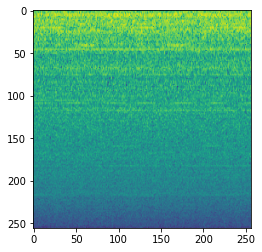

In [ ]:
class Task2Dataset(torch.utils.data.Dataset):
    """PyTorch dataset class for task2. Caching to a file supported.

    Args:
        n_mels, frames, n_fft, hop_length, power, transform: Audio conversion settings.
        normalize: Normalize data value range from [-90, 24] to [0, 1] for VAE, False by default.
        cache_to: Cache filename or None by default, use this for your iterative development.
    """

    def __init__(self, files, n_mels, frames, n_fft, hop_length, power, transform,
                 normalize=False, cache_to=None):
        self.transform = transform
        self.files = files
        self.n_mels, self.frames, self.n_fft = n_mels, frames, n_fft
        self.hop_length, self.power = hop_length, power
        self.normalize = normalize

    def __len__(self):
        return len(self.files)

    def __getitem__(self, index):
        x, _ = get_log_mel_spectrogram(self.files[index],
                                 n_mels=self.n_mels,
                                 n_fft=self.n_fft,
                                 hop_length=self.hop_length,
                                 power=self.power)
        if self.normalize:
            x = pytorch_common.normalize_0to1(x)
        if self.transform:
          x = self.transform(x)
          trs = torchvision.transforms.RandomCrop((256, 256))
          x = trs(x)
        return x, x


# VAE Training class
class Task2VAELightning(pl.LightningModule):
    """Task2 PyTorch Lightning class, for training only."""

    def __init__(self, device, model, params, files, normalize=False):
        super().__init__()
        self.params = params
        self.normalize = normalize
        self.model = model
        self.mseloss = torch.nn.MSELoss()
        # split data files
        if files is not None:
            n_val = int(params.fit.validation_split * len(files))
            self.val_files = random.sample(files, n_val)
            self.train_files = [f for f in files if f not in self.val_files]

    def forward(self, x):
        return self.model.forward(x)
    
    def training_step(self, batch, batch_nb):
        x, y = batch
        x = x.to(device=device)
        y = y.to(device=device)
        y_hat= self.model.forward(x)
        loss = self.mseloss(y_hat, x)
        tensorboard_logs = {'train_loss': loss}
        return {'loss': loss, 'log': tensorboard_logs}

    def validation_step(self, batch, batch_nb):
        x, y = batch
        x = x.to(device=device)
        y = y.to(device=device)
        y_hat = self.forward(x)
        return {'val_loss': self.mseloss(y_hat, y)}

    def validation_epoch_end(self, outputs):
        avg_loss = torch.stack([x['val_loss'] for x in outputs]).mean()
        tensorboard_logs = {'val_loss': avg_loss}
        return {'avg_val_loss': avg_loss, 'log': tensorboard_logs}

    def configure_optimizers(self):
        optim = torch.optim.Adam(self.parameters(), lr=self.params.fit.lr,
                                betas=(self.params.fit.b1, self.params.fit.b2),
                                weight_decay=self.params.fit.weight_decay)
        return optim

    def _get_dl(self, for_what):
        files = self.train_files if for_what == 'train' else self.val_files
        cache_file = f'{self.params.model_directory}/__cache_{str(files[0]).split("/")[-3]}_{for_what}.npy'
        ds = Task2Dataset(files,
                          n_mels=self.params.feature.n_mels,
                          frames=self.params.feature.frames,
                          n_fft=self.params.feature.n_fft,
                          hop_length=self.params.feature.hop_length,
                          power=self.params.feature.power,
                          transform=ToTensor1ch(device=self.device, image=True),
                          normalize=self.normalize,
                          cache_to=cache_file)
        return torch.utils.data.DataLoader(ds, batch_size=self.params.fit.batch_size,
                          shuffle=(self.params.fit.shuffle if for_what == 'train' else False))

    def train_dataloader(self):
        return self._get_dl('train')

    def val_dataloader(self):
        return self._get_dl('val')
    
    def get_ds(self, for_what):
        files = self.train_files if for_what == 'train' else self.val_files
        ds = Task2Dataset(files,
                          n_mels=self.params.feature.n_mels,
                          frames=self.params.feature.frames,
                          n_fft=self.params.feature.n_fft,
                          hop_length=self.params.feature.hop_length,
                          power=self.params.feature.power,
                          transform=ToTensor1ch(device=self.device, image=True),
                          normalize=self.normalize,
                          cache_to=None)
        return ds


for target_dir in dirs:      
    target = str(target_dir).split('/')[-1]
    print(f'==== Start training [{target}] with {torch.cuda.device_count()} GPU(s). ====')

    files = com.file_list_generator(target_dir)

    model = CNNAutoEncoder().to(device)
    torchsummary.summary(model, (1, 128, 128))
    task2 = Task2VAELightning(device, model, params, files, normalize=True)

    dataset = task2.get_ds('train')
    print(dataset[0][0])
    plt.imshow(dataset[100][0].squeeze(0).cpu())
    plt.show()

In [ ]:
import torch
torch.cuda.empty_cache()

In [ ]:
!nvidia-smi

Fri May 20 20:46:32 2022       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 460.32.03    Driver Version: 460.32.03    CUDA Version: 11.2     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla P100-PCIE...  Off  | 00000000:00:04.0 Off |                    0 |
| N/A   42C    P0    34W / 250W |   1463MiB / 16280MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

2022-05-20 20:47:07,121 - INFO - target_dir : dev_data/slider
2022-05-20 20:47:07,121 - INFO - target_dir : dev_data/slider
2022-05-20 20:47:07,121 - INFO - target_dir : dev_data/slider
2022-05-20 20:47:07,121 - INFO - target_dir : dev_data/slider
2022-05-20 20:47:07,135 - INFO - # of training samples : 2370
2022-05-20 20:47:07,135 - INFO - # of training samples : 2370
2022-05-20 20:47:07,135 - INFO - # of training samples : 2370
2022-05-20 20:47:07,135 - INFO - # of training samples : 2370


==== Start training [slider] with 1 GPU(s). ====
----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
         ZeroPad2d-1          [-1, 1, 131, 316]               0
            Conv2d-2          [-1, 32, 64, 156]             832
              ReLU-3          [-1, 32, 64, 156]               0
         ZeroPad2d-4          [-1, 32, 67, 159]               0
            Conv2d-5           [-1, 64, 32, 78]          51,264
              ReLU-6           [-1, 64, 32, 78]               0
           Dropout-7           [-1, 64, 32, 78]               0
            Conv2d-8          [-1, 128, 15, 38]          73,856
              ReLU-9          [-1, 128, 15, 38]               0
          Dropout-10          [-1, 128, 15, 38]               0
           Conv2d-11           [-1, 256, 7, 18]         295,168
             ReLU-12           [-1, 256, 7, 18]               0
          Dropout-13           [-1, 256, 7, 18]       

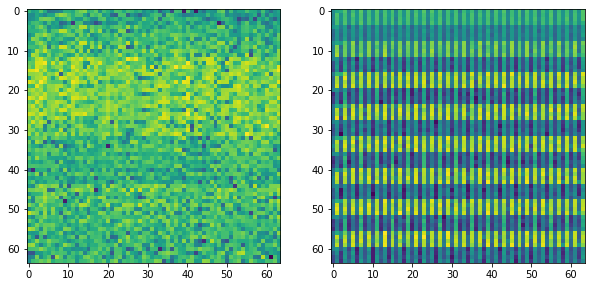

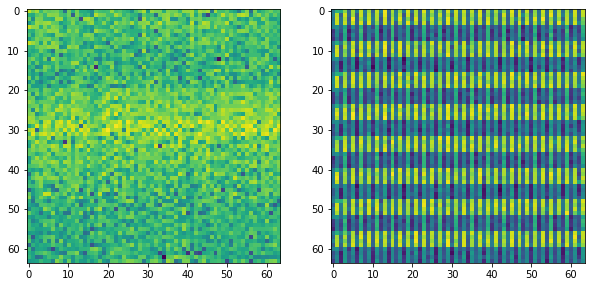

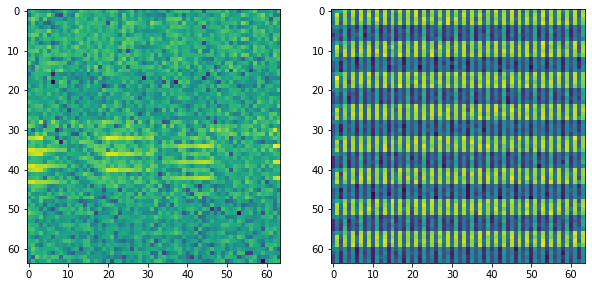

Sanity Checking: 0it [00:00, ?it/s]

/usr/local/lib/python3.7/dist-packages/pytorch_lightning/trainer/connectors/data_connector.py:245: PossibleUserWarning: The dataloader, val_dataloader 0, does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` (try 4 which is the number of cpus on this machine) in the `DataLoader` init to improve performance.
  category=PossibleUserWarning,
/usr/local/lib/python3.7/dist-packages/pytorch_lightning/trainer/connectors/data_connector.py:245: PossibleUserWarning: The dataloader, train_dataloader, does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` (try 4 which is the number of cpus on this machine) in the `DataLoader` init to improve performance.
  category=PossibleUserWarning,


Training: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

saved ./model/model_slider.pth.



In [ ]:
# train models

def train():
    for target_dir in dirs:
        target = str(target_dir).split('/')[-1]
        print(f'==== Start training [{target}] with {torch.cuda.device_count()} GPU(s). ====')

        files = com.file_list_generator(target_dir)

        model = CNNAutoEncoder().to(device)
        torchsummary.summary(model, (1, 128, 313))
        task2 = Task2VAELightning(device, model, params, files, normalize=True)
        pytorch_common.show_some_predictions(task2.train_dataloader(), task2.model, 0, 3, image=True)
        plt.show()
        trainer = pl.Trainer(max_epochs=params.fit.epochs,
                             gpus=torch.cuda.device_count(), log_every_n_steps=3)
        trainer.fit(task2)

        model_file = f'{params.model_directory}/model_{target}.pth'
        torch.save(task2.model.state_dict(), model_file)
        print(f'saved {model_file}.\n')
        
train()

In [ ]:
def test_file_list_generator(target_dir,
                             id_name, mode,
                             dir_name="test",
                             prefix_normal="normal",
                             prefix_anomaly="anomaly",
                             ext="wav"):
    """
    target_dir : str
        base directory path of the dev_data or eval_data
    id_name : str
        id of wav file in <<test_dir_name>> directory
    dir_name : str (default="test")
        directory containing test data
    prefix_normal : str (default="normal")
        normal directory name
    prefix_anomaly : str (default="anomaly")
        anomaly directory name
    ext : str (default="wav")
        file extension of audio files

    return :
        if the mode is "development":
            test_files : list [ str ]
                file list for test
            test_labels : list [ boolean ]
                label info. list for test
                * normal/anomaly = 0/1
        if the mode is "evaluation":
            test_files : list [ str ]
                file list for test
    """
    com.logger.info("target_dir : {}".format(Path(target_dir+"_"+id_name).name))

    # development
    if mode:
        normal_files = sorted(
            glob.glob("{dir}/{dir_name}/{prefix_normal}_{id_name}*.{ext}".format(dir=target_dir,
                                                                                 dir_name=dir_name,
                                                                                 prefix_normal=prefix_normal,
                                                                                 id_name=id_name,
                                                                                 ext=ext)))
        normal_labels = np.zeros(len(normal_files))
        anomaly_files = sorted(
            glob.glob("{dir}/{dir_name}/{prefix_anomaly}_{id_name}*.{ext}".format(dir=target_dir,
                                                                                  dir_name=dir_name,
                                                                                  prefix_anomaly=prefix_anomaly,
                                                                                  id_name=id_name,
                                                                                  ext=ext)))
        anomaly_labels = np.ones(len(anomaly_files))
        files = np.concatenate((normal_files, anomaly_files), axis=0)
        labels = np.concatenate((normal_labels, anomaly_labels), axis=0)
        com.logger.info("test_file  num : {num}".format(num=len(files)))
        if len(files) == 0:
            com.logger.exception("no_wav_file!!")
        print("\n========================================")

    # evaluation
    else:
        files = sorted(
            glob.glob("{dir}/{dir_name}/*{id_name}*.{ext}".format(dir=target_dir,
                                                                  dir_name=dir_name,
                                                                  id_name=id_name,
                                                                  ext=ext)))
        labels = None
        com.logger.info("test_file  num : {num}".format(num=len(files)))
        if len(files) == 0:
            com.logger.exception("no_wav_file!!")
        print("\n=========================================")

    return files, labels

In [ ]:
def save_csv(save_file_path,
             save_data):
    with open(save_file_path, "w", newline="") as f:
        writer = csv.writer(f, lineterminator='\n')
        writer.writerows(save_data)


def get_machine_id_list_for_test(target_dir,
                                 dir_name="test",
                                 ext="wav"):
    """
    target_dir : str
        base directory path of "dev_data" or "eval_data"
    test_dir_name : str (default="test")
        directory containing test data
    ext : str (default="wav)
        file extension of audio files

    return :
        machine_id_list : list [ str ]
            list of machine IDs extracted from the names of test files
    """
    # create test files
    dir_path = os.path.abspath("{dir}/{dir_name}/*.{ext}".format(dir=target_dir, dir_name=dir_name, ext=ext))
    file_paths = sorted(glob.glob(dir_path))
    # extract id
    machine_id_list = sorted(list(set(itertools.chain.from_iterable(
        [re.findall('id_[0-9][0-9]', ext_id) for ext_id in file_paths]))))
    return machine_id_list


[1/1] /content/data/dev_data/dev_data/slider
(4096, 64, 64) (4096, 64, 64)


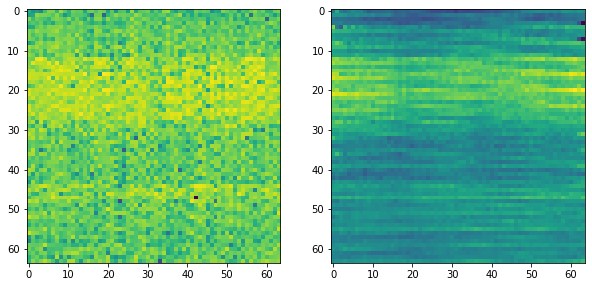

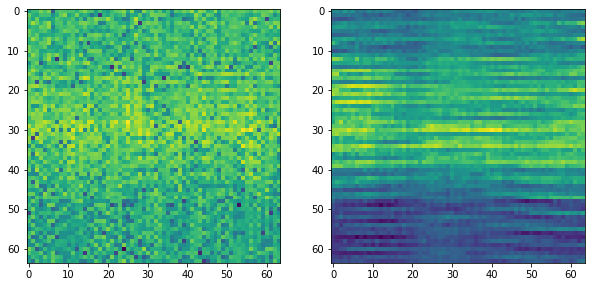

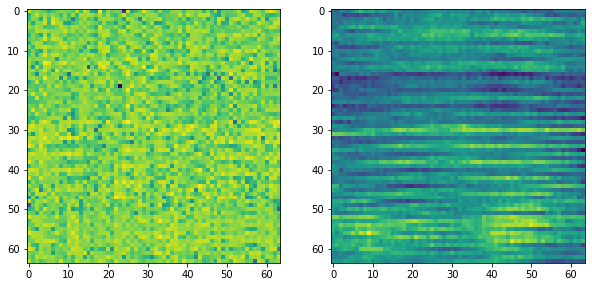

In [ ]:
for idx, target_dir in enumerate(dirs):
  print("\n===========================")
  print("[{idx}/{total}] {dirname}".format(dirname=target_dir, idx=idx+1, total=len(dirs)))
  machine_type = os.path.split(target_dir)[1]
  model = CNNAutoEncoder().to(device)
  model_file = "{model}/model_{machine_type}.pth".format(model=params.model_directory,
                                                        machine_type=machine_type)
  pytorch_common.load_weights(model, model_file)
  task2 = Task2VAELightning(device, model, params, files, normalize=True)
  pytorch_common.show_some_predictions(task2.train_dataloader(), task2.model, 0, 3, image=True)

# Testing on Development dataset

2022-05-20 22:06:04,834 - INFO - load_directory <- development
2022-05-20 22:06:04,834 - INFO - load_directory <- development
2022-05-20 22:06:04,834 - INFO - load_directory <- development
2022-05-20 22:06:04,834 - INFO - load_directory <- development
2022-05-20 22:06:04,838 - INFO - loading model: ./model/model_slider.pth
2022-05-20 22:06:04,838 - INFO - loading model: ./model/model_slider.pth
2022-05-20 22:06:04,838 - INFO - loading model: ./model/model_slider.pth
2022-05-20 22:06:04,838 - INFO - loading model: ./model/model_slider.pth
2022-05-20 22:06:04,888 - INFO - target_dir : slider_id_00
2022-05-20 22:06:04,888 - INFO - target_dir : slider_id_00
2022-05-20 22:06:04,888 - INFO - target_dir : slider_id_00
2022-05-20 22:06:04,888 - INFO - target_dir : slider_id_00
2022-05-20 22:06:04,898 - INFO - test_file  num : 456
2022-05-20 22:06:04,898 - INFO - test_file  num : 456
2022-05-20 22:06:04,898 - INFO - test_file  num : 456
2022-05-20 22:06:04,898 - INFO - test_file  num : 456



[1/1] /content/data/dev_data/dev_data/slider
============== MODEL LOAD ==============
----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
         ZeroPad2d-1          [-1, 1, 259, 259]               0
            Conv2d-2         [-1, 32, 128, 128]             832
              ReLU-3         [-1, 32, 128, 128]               0
         ZeroPad2d-4         [-1, 32, 131, 131]               0
            Conv2d-5           [-1, 64, 64, 64]          51,264
              ReLU-6           [-1, 64, 64, 64]               0
           Dropout-7           [-1, 64, 64, 64]               0
            Conv2d-8          [-1, 128, 31, 31]          73,856
              ReLU-9          [-1, 128, 31, 31]               0
          Dropout-10          [-1, 128, 31, 31]               0
           Conv2d-11          [-1, 256, 15, 15]         295,168
             ReLU-12          [-1, 256, 15, 15]               0
          Dropou

  0%|          | 0/456 [00:00<?, ?it/s]

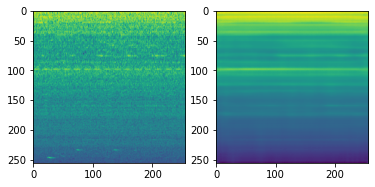

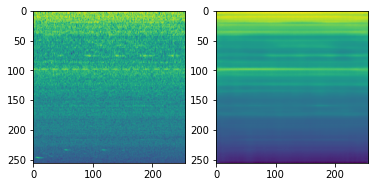

100%|██████████| 456/456 [00:13<00:00, 33.33it/s]
2022-05-20 22:06:18,596 - INFO - anomaly score result ->  ./result/anomaly_score_slider_id_00.csv
2022-05-20 22:06:18,596 - INFO - anomaly score result ->  ./result/anomaly_score_slider_id_00.csv
2022-05-20 22:06:18,596 - INFO - anomaly score result ->  ./result/anomaly_score_slider_id_00.csv
2022-05-20 22:06:18,596 - INFO - anomaly score result ->  ./result/anomaly_score_slider_id_00.csv
2022-05-20 22:06:18,628 - INFO - AUC : 0.9821348314606742
2022-05-20 22:06:18,628 - INFO - AUC : 0.9821348314606742
2022-05-20 22:06:18,628 - INFO - AUC : 0.9821348314606742
2022-05-20 22:06:18,628 - INFO - AUC : 0.9821348314606742
2022-05-20 22:06:18,640 - INFO - pAUC : 0.9120342992312241
2022-05-20 22:06:18,640 - INFO - pAUC : 0.9120342992312241
2022-05-20 22:06:18,640 - INFO - pAUC : 0.9120342992312241
2022-05-20 22:06:18,640 - INFO - pAUC : 0.9120342992312241
2022-05-20 22:06:18,650 - INFO - target_dir : slider_id_02
2022-05-20 22:06:18,650 - INFO 


============ END OF TEST FOR A MACHINE ID ============


============== BEGIN TEST FOR A MACHINE ID ==============


  0%|          | 0/367 [00:00<?, ?it/s]

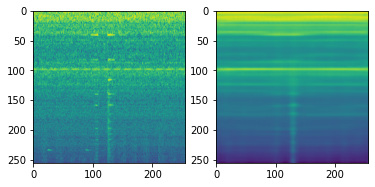

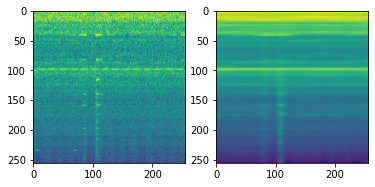

100%|██████████| 367/367 [00:11<00:00, 33.18it/s]
2022-05-20 22:06:29,757 - INFO - anomaly score result ->  ./result/anomaly_score_slider_id_02.csv
2022-05-20 22:06:29,757 - INFO - anomaly score result ->  ./result/anomaly_score_slider_id_02.csv
2022-05-20 22:06:29,757 - INFO - anomaly score result ->  ./result/anomaly_score_slider_id_02.csv
2022-05-20 22:06:29,757 - INFO - anomaly score result ->  ./result/anomaly_score_slider_id_02.csv
2022-05-20 22:06:29,786 - INFO - AUC : 0.7087265917602995
2022-05-20 22:06:29,786 - INFO - AUC : 0.7087265917602995
2022-05-20 22:06:29,786 - INFO - AUC : 0.7087265917602995
2022-05-20 22:06:29,786 - INFO - AUC : 0.7087265917602995
2022-05-20 22:06:29,800 - INFO - pAUC : 0.5205992509363296
2022-05-20 22:06:29,800 - INFO - pAUC : 0.5205992509363296
2022-05-20 22:06:29,800 - INFO - pAUC : 0.5205992509363296
2022-05-20 22:06:29,800 - INFO - pAUC : 0.5205992509363296
2022-05-20 22:06:29,814 - INFO - target_dir : slider_id_04
2022-05-20 22:06:29,814 - INFO 


============ END OF TEST FOR A MACHINE ID ============


============== BEGIN TEST FOR A MACHINE ID ==============


  0%|          | 0/278 [00:00<?, ?it/s]

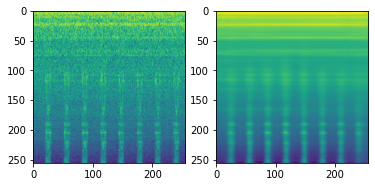

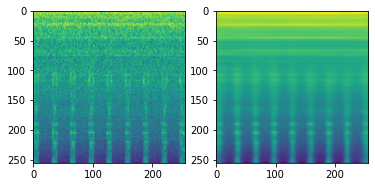

100%|██████████| 278/278 [00:08<00:00, 31.90it/s]
2022-05-20 22:06:38,566 - INFO - anomaly score result ->  ./result/anomaly_score_slider_id_04.csv
2022-05-20 22:06:38,566 - INFO - anomaly score result ->  ./result/anomaly_score_slider_id_04.csv
2022-05-20 22:06:38,566 - INFO - anomaly score result ->  ./result/anomaly_score_slider_id_04.csv
2022-05-20 22:06:38,566 - INFO - anomaly score result ->  ./result/anomaly_score_slider_id_04.csv
2022-05-20 22:06:38,580 - INFO - AUC : 0.5797752808988764
2022-05-20 22:06:38,580 - INFO - AUC : 0.5797752808988764
2022-05-20 22:06:38,580 - INFO - AUC : 0.5797752808988764
2022-05-20 22:06:38,580 - INFO - AUC : 0.5797752808988764
2022-05-20 22:06:38,591 - INFO - pAUC : 0.5422826729745712
2022-05-20 22:06:38,591 - INFO - pAUC : 0.5422826729745712
2022-05-20 22:06:38,591 - INFO - pAUC : 0.5422826729745712
2022-05-20 22:06:38,591 - INFO - pAUC : 0.5422826729745712
2022-05-20 22:06:38,603 - INFO - AUC and pAUC results -> ./result/result.csv
2022-05-20 22


============ END OF TEST FOR A MACHINE ID ============


In [ ]:
def test():
    # make output result directory
    os.makedirs(params.result_directory, exist_ok=True)

    # load base directory
    dirs = com.select_dirs(param=params, mode=params.mode)

    # initialize lines in csv for AUC and pAUC
    csv_lines = []

    # PyTorch version specific...
    to_tensor = pytorch_common.ToTensor1ch()
    device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

    # loop of the base directory
    for idx, target_dir in enumerate(dirs):
        print("\n===========================")
        print("[{idx}/{total}] {dirname}".format(dirname=target_dir, idx=idx+1, total=len(dirs)))
        machine_type = os.path.split(target_dir)[1]

        print("============== MODEL LOAD ==============")
        # set model path
        model_file = "{model}/model_{machine_type}.pth".format(model=params.model_directory,
                                                               machine_type=machine_type)

        # load model file
        if not os.path.exists(model_file):
            com.logger.error("{} model not found ".format(machine_type))
            sys.exit(-1)
        com.logger.info("loading model: {}".format(model_file))
        model = CNNAutoEncoder().to(device)
        pytorch_common.load_weights(model, model_file)
        torchsummary.summary(model, (1, 256, 256))
        model.eval()

        if params.mode:
            # results by type
            csv_lines.append([machine_type])
            csv_lines.append(["id", "AUC", "pAUC"])
            performance = []

        machine_id_list = get_machine_id_list_for_test(target_dir)

        for id_str in machine_id_list:
            # load test file
            test_files, y_true = test_file_list_generator(target_dir, id_str, mode=params.mode)

            # setup anomaly score file path
            anomaly_score_csv = "{result}/anomaly_score_{machine_type}_{id_str}.csv".format(
                                                                                     result=params.result_directory,
                                                                                     machine_type=machine_type,
                                                                                     id_str=id_str)
            anomaly_score_list = []

            print("\n============== BEGIN TEST FOR A MACHINE ID ==============")
            y_pred = [0. for k in test_files]
            for file_idx, file_path in tqdm(enumerate(test_files), total=len(test_files)):
                data = imgc.file_to_vector_array_2d(file_path,
                                                n_mels=params.feature.n_mels,
                                                n_fft=params.feature.n_fft,
                                                hop_length=params.feature.hop_length,
                                                power=params.feature.power)
                data = pytorch_common.normalize_0to1(data)
                trs = torchvision.transforms.RandomCrop((256, 256))
                data = trs(to_tensor(data))
                with torch.no_grad():
                    yhat = model(data).cpu().detach().numpy().reshape(data.shape)
                    data = data.cpu().detach().numpy()
                    errors = np.mean(np.square(data - yhat), axis=1)
                    if file_idx in [0, 500]:
                        for i in range(2):
                            fig, axs = plt.subplots(1, 2)
                            axs[0].imshow(data[i].squeeze())
                            axs[1].imshow(yhat[i].squeeze())
                            plt.show()
                y_pred[file_idx] = np.mean(errors)
                anomaly_score_list.append([os.path.basename(file_path), y_pred[file_idx]])

            # save anomaly score
            #anomaly_score_list = [[elem[0], 0] if elem[1] < 0.0005 else [elem[0], 1] for elem in anomaly_score_list]
            #y_pred = [0 if elem < 0.0005 else 1 for elem in y_pred]
            #values = [elem[1] for elem in anomaly_score_list]
            #plt.hist(values)
            #plt.show()
            save_csv(save_file_path=anomaly_score_csv, save_data=anomaly_score_list)
            com.logger.info("anomaly score result ->  {}".format(anomaly_score_csv))

            if params.mode:
                # append AUC and pAUC to lists
                auc = metrics.roc_auc_score(y_true, y_pred)
                p_auc = metrics.roc_auc_score(y_true, y_pred, max_fpr=params.max_fpr)
                csv_lines.append([id_str.split("_", 1)[1], auc, p_auc])
                performance.append([auc, p_auc])
                com.logger.info("AUC : {}".format(auc))
                com.logger.info("pAUC : {}".format(p_auc))

            print("\n============ END OF TEST FOR A MACHINE ID ============")

        if params.mode:
            # calculate averages for AUCs and pAUCs
            averaged_performance = numpy.mean(numpy.array(performance, dtype=float), axis=0)
            csv_lines.append(["Average"] + list(averaged_performance))
            csv_lines.append([])

    if params.mode:
        # output results
        result_path = "{result}/{file_name}".format(result=params.result_directory, file_name=params.result_file)
        com.logger.info("AUC and pAUC results -> {}".format(result_path))
        save_csv(save_file_path=result_path, save_data=csv_lines)

params.mode = True
test()

In [ ]:
def upto_6digits(cell):
    if not cell[0].isdigit(): return cell
    return f'{float(cell):.6f}'

if params.mode:
    with open('./result/result.csv') as f:
        for l in f.readlines():
            l = l.strip() #replace('\n', '')
            if ',' not in l:
                print(l)
                continue
            ls = l.split(',')
            print(f'{ls[0]}\t\t{upto_6digits(ls[1])}\t\t{upto_6digits(ls[2])}')

slider
id		AUC		pAUC
00		0.982135		0.912034
02		0.708727		0.520599
04		0.579775		0.542283
Average		0.756879		0.658305



# Testing on the Evaluation dataset and generating submission file

In [ ]:
# re-training on evaluation dataset
params.mode = False
#train() # due to the memory restriction, restart the kernel and train on only evaluation dataset

2022-05-20 22:07:22,428 - INFO - load_directory <- evaluation
2022-05-20 22:07:22,428 - INFO - load_directory <- evaluation
2022-05-20 22:07:22,428 - INFO - load_directory <- evaluation
2022-05-20 22:07:22,428 - INFO - load_directory <- evaluation
2022-05-20 22:07:22,432 - INFO - loading model: ./model/model_slider.pth
2022-05-20 22:07:22,432 - INFO - loading model: ./model/model_slider.pth
2022-05-20 22:07:22,432 - INFO - loading model: ./model/model_slider.pth
2022-05-20 22:07:22,432 - INFO - loading model: ./model/model_slider.pth
2022-05-20 22:07:22,475 - INFO - target_dir : slider_id_01
2022-05-20 22:07:22,475 - INFO - target_dir : slider_id_01
2022-05-20 22:07:22,475 - INFO - target_dir : slider_id_01
2022-05-20 22:07:22,475 - INFO - target_dir : slider_id_01
2022-05-20 22:07:22,483 - INFO - test_file  num : 278
2022-05-20 22:07:22,483 - INFO - test_file  num : 278
2022-05-20 22:07:22,483 - INFO - test_file  num : 278
2022-05-20 22:07:22,483 - INFO - test_file  num : 278



[1/1] /content/data/eval_data/eval_data/slider
============== MODEL LOAD ==============
----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
         ZeroPad2d-1          [-1, 1, 259, 259]               0
            Conv2d-2         [-1, 32, 128, 128]             832
              ReLU-3         [-1, 32, 128, 128]               0
         ZeroPad2d-4         [-1, 32, 131, 131]               0
            Conv2d-5           [-1, 64, 64, 64]          51,264
              ReLU-6           [-1, 64, 64, 64]               0
           Dropout-7           [-1, 64, 64, 64]               0
            Conv2d-8          [-1, 128, 31, 31]          73,856
              ReLU-9          [-1, 128, 31, 31]               0
          Dropout-10          [-1, 128, 31, 31]               0
           Conv2d-11          [-1, 256, 15, 15]         295,168
             ReLU-12          [-1, 256, 15, 15]               0
          Drop

  0%|          | 0/278 [00:00<?, ?it/s]

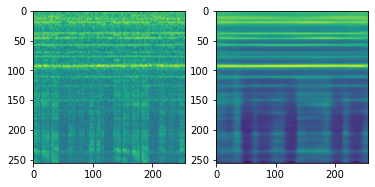

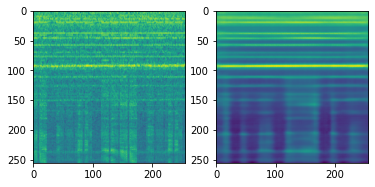

100%|██████████| 278/278 [00:08<00:00, 31.87it/s]
2022-05-20 22:07:31,215 - INFO - anomaly score result ->  ./result/anomaly_score_slider_id_01.csv
2022-05-20 22:07:31,215 - INFO - anomaly score result ->  ./result/anomaly_score_slider_id_01.csv
2022-05-20 22:07:31,215 - INFO - anomaly score result ->  ./result/anomaly_score_slider_id_01.csv
2022-05-20 22:07:31,215 - INFO - anomaly score result ->  ./result/anomaly_score_slider_id_01.csv
2022-05-20 22:07:31,219 - INFO - target_dir : slider_id_03
2022-05-20 22:07:31,219 - INFO - target_dir : slider_id_03
2022-05-20 22:07:31,219 - INFO - target_dir : slider_id_03
2022-05-20 22:07:31,219 - INFO - target_dir : slider_id_03
2022-05-20 22:07:31,241 - INFO - test_file  num : 278
2022-05-20 22:07:31,241 - INFO - test_file  num : 278
2022-05-20 22:07:31,241 - INFO - test_file  num : 278
2022-05-20 22:07:31,241 - INFO - test_file  num : 278



============ END OF TEST FOR A MACHINE ID ============


============== BEGIN TEST FOR A MACHINE ID ==============


  0%|          | 0/278 [00:00<?, ?it/s]

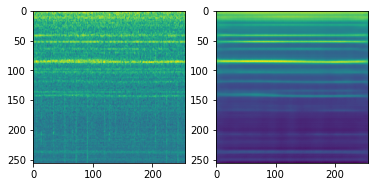

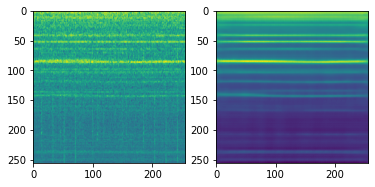

100%|██████████| 278/278 [00:09<00:00, 30.88it/s]
2022-05-20 22:07:40,275 - INFO - anomaly score result ->  ./result/anomaly_score_slider_id_03.csv
2022-05-20 22:07:40,275 - INFO - anomaly score result ->  ./result/anomaly_score_slider_id_03.csv
2022-05-20 22:07:40,275 - INFO - anomaly score result ->  ./result/anomaly_score_slider_id_03.csv
2022-05-20 22:07:40,275 - INFO - anomaly score result ->  ./result/anomaly_score_slider_id_03.csv
2022-05-20 22:07:40,295 - INFO - target_dir : slider_id_05
2022-05-20 22:07:40,295 - INFO - target_dir : slider_id_05
2022-05-20 22:07:40,295 - INFO - target_dir : slider_id_05
2022-05-20 22:07:40,295 - INFO - target_dir : slider_id_05
2022-05-20 22:07:40,310 - INFO - test_file  num : 278
2022-05-20 22:07:40,310 - INFO - test_file  num : 278
2022-05-20 22:07:40,310 - INFO - test_file  num : 278
2022-05-20 22:07:40,310 - INFO - test_file  num : 278



============ END OF TEST FOR A MACHINE ID ============


============== BEGIN TEST FOR A MACHINE ID ==============


  0%|          | 0/278 [00:00<?, ?it/s]

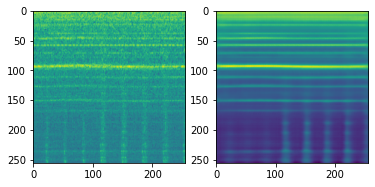

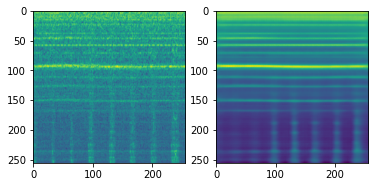

100%|██████████| 278/278 [00:08<00:00, 31.58it/s]
2022-05-20 22:07:49,145 - INFO - anomaly score result ->  ./result/anomaly_score_slider_id_05.csv
2022-05-20 22:07:49,145 - INFO - anomaly score result ->  ./result/anomaly_score_slider_id_05.csv
2022-05-20 22:07:49,145 - INFO - anomaly score result ->  ./result/anomaly_score_slider_id_05.csv
2022-05-20 22:07:49,145 - INFO - anomaly score result ->  ./result/anomaly_score_slider_id_05.csv



============ END OF TEST FOR A MACHINE ID ============


In [ ]:
test()

In [ ]:
import numpy as np
import pandas as pd

df1 = pd.read_csv('./result/anomaly_score_slider_id_01.csv', delimiter=',', header=None)
df3 = pd.read_csv('./result/anomaly_score_slider_id_03.csv', delimiter=',', header=None)
df5 = pd.read_csv('./result/anomaly_score_slider_id_05.csv', delimiter=',', header=None)

dfs = [df1, df3, df5]
eval_df = pd.concat(dfs)
eval_df = eval_df.rename(columns={0: "file_name", 1: "anomaly_score"})

eval_df.to_csv('./result/baseline_submission.csv',index = False)


In [ ]:
eval_df.head()

,file_name,anomaly_score
0,id_01_00000000.wav,0.001662
1,id_01_00000001.wav,0.001328
2,id_01_00000002.wav,0.001360
3,id_01_00000003.wav,0.001328
4,id_01_00000004.wav,0.001582
